# Введение

In [1]:
import warnings
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_diabetes, fetch_openml,load_iris,fetch_california_housing
from sklearn.feature_selection import mutual_info_regression, f_regression, RFE, SelectFromModel, SelectKBest, f_classif
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import (
RepeatedStratifiedKFold, 
cross_val_score, 
train_test_split, 
GridSearchCV,
cross_val_predict, 
learning_curve, 
validation_curve)
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_absolute_error,zero_one_loss, roc_auc_score
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report, mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from imblearn.under_sampling import RandomUnderSampler
from os.path import join as pjoin
from mlxtend.evaluate import bias_variance_decomp
#sharper plots
%config InlineBackend.figure_format = 'retina'

from sklearn.linear_model import (LogisticRegression, LogisticRegressionCV,
                                  SGDClassifier)

warnings.filterwarnings("ignore")

In [2]:
data_path = "C:\Slava\spbu_ml_2026\data" 

## Проклятие размерности

 Проклятие размерности означает, что по мере увеличения количества объектов или измерений в наборе данных объем данных, необходимый для эффективного моделирования взаимосвязи между объектами и целевой переменной, растет экспоненциально.

Чем больше мы добавляем признаков, не увеличивая объем данных, используемых для обучения модели, тем больше увеличивается среднее расстояние между точками в пространстве признаков. Из-за такой разреженности становится гораздо проще найти удобное и совершенное, но не столь оптимальное решение для модели машинного обучения. Следовательно, модель плохо обобщает, что делает прогнозы ненадежными. Это может привести к таким проблемам, как переобучение и снижение точности.

Чтобы смягчить проклятие размерности, можно использовать такие методы, как выбор признаков, уменьшение размерности и ансамблевые методы.

Для примера рассмотрим 1000 случайных точек в пространствах размерности от 2 до 50. Построим график, показывающий это свойство.

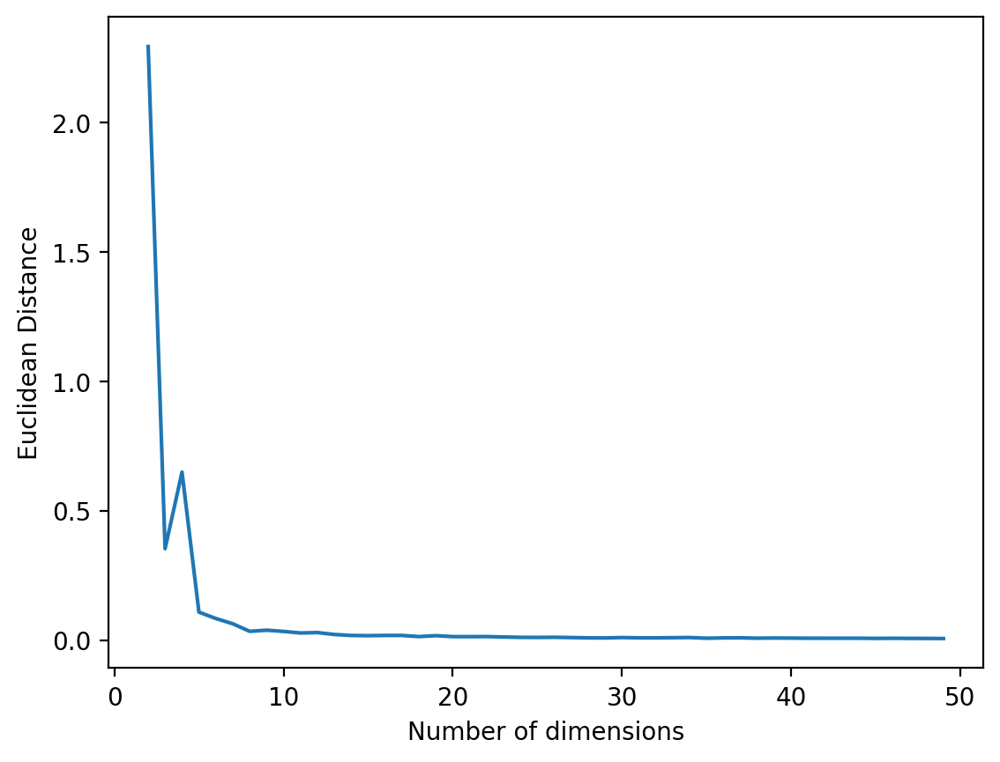

In [3]:
deltas = []
for N in range(2,50):
    # Generate 1000 random points in N dimensions.
    P = [np.random.randint(-100, 100, N) for _ in range(10000)]
    Q = np.random.randint(-100,100, N)
    diffs = [np.linalg.norm(p-Q) for p in P]
    mxd = max(diffs)
    mnd = min(diffs)
    delta = math.log10(mxd-mnd)/mnd
    deltas.append( delta )

plt.plot(range(2,50),deltas)
plt.xlabel('Number of dimensions')
plt.ylabel('Euclidean Distance')
plt.show()

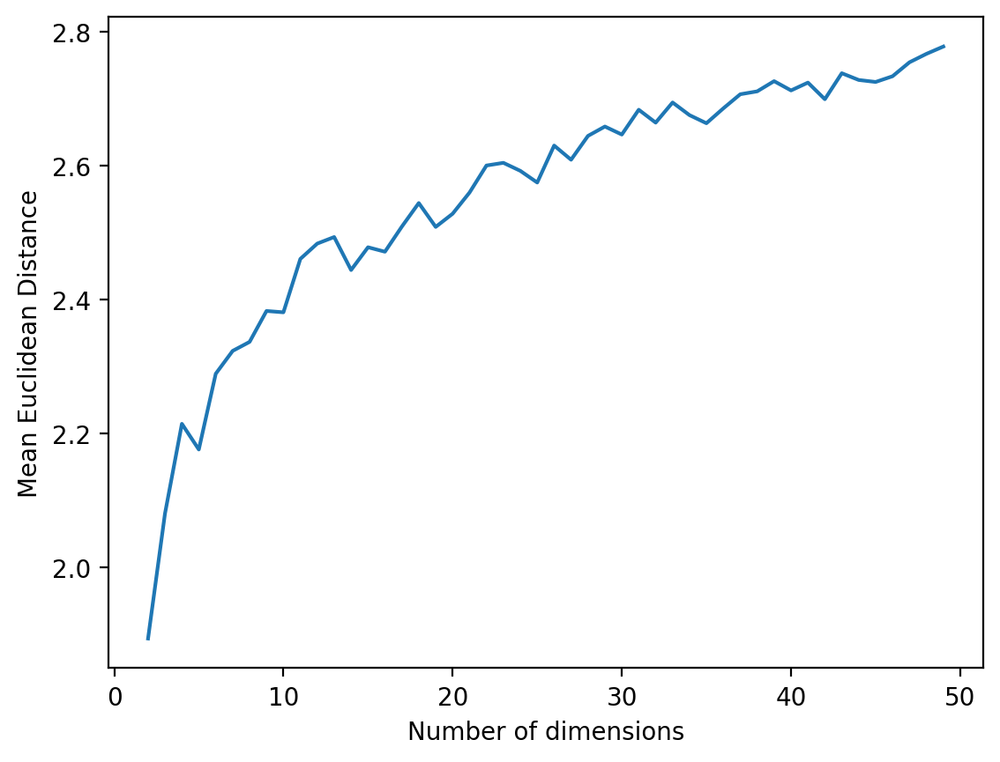

In [4]:
deltas = []
for N in range(2,50):
    # Generate 1000 random points in N dimensions.
    P = [np.random.randint(-100, 100, N) for _ in range(10000)]
    Q = np.random.randint(-100,100,N)
    diffs = [np.linalg.norm(p-Q) for p in P]
    mnd = min(diffs)
    delta = math.log10(np.mean(diffs))
    deltas.append( delta )

plt.plot(range(2,50),deltas)
plt.xlabel('Number of dimensions')
plt.ylabel('Mean Euclidean Distance')
plt.show()

Для того, чтобы уменьшить влияние проклятия размерности, используются разные техники:
 - Feature selection. Выбор наиболее релевантных функций из набора данных может помочь уменьшить размерность и повысить производительность модели.
 - Снижение размерности. Такие методы, как анализ главных компонент (PCA), линейный дискриминантный анализ (LDA) и t-SNE, могут использоваться для уменьшения размерности данных при сохранении наиболее важной информации.
 - Регуляризация. Методы регуляризации, такие как L1 и L2, могут помочь предотвратить переобучение в многомерных наборах данных путем добавления штрафного члена к функции потерь.
 - Ансамблевые методы. Объединение результатов нескольких моделей также может помочь повысить производительность в многомерных наборах данных.
 - Увеличение размера набора обучающих данных также может помочь преодолеть проклятие размерности, однако сбор большего количества данных может занять много времени и стоит дорого.
 - Генерация синтетических данных. Генерацию синтетических данных также можно использовать для увеличения размера набора данных, особенно когда сбор большего количества реальных данных невозможен.

В этом ноутбуке мы рассмотрим некоторые методы оценки важности признаков, а также их отбора на основе важности. 

### Feature selection

UCI MAGIC dataset: https://archive.ics.uci.edu/ml/datasets/magic+gamma+telescope

Описание признаков:

- Length: continuous # major axis of ellipse [mm]
- Width: continuous # minor axis of ellipse [mm]
- Size: continuous # 10-log of sum of content of all pixels [in #phot]
- Conc: continuous # ratio of sum of two highest pixels over fSize [ratio]
- Conc1: continuous # ratio of highest pixel over fSize [ratio]
- Asym: continuous # distance from highest pixel to center, projected onto major axis [mm]
- M3Long: continuous # 3rd root of third moment along major axis [mm]
- M3Trans: continuous # 3rd root of third moment along minor axis [mm]
- Alpha: continuous # angle of major axis with vector to origin [deg]
- Dist: continuous # distance from origin to center of ellipse [mm]
- Label: g,h # gamma (signal), hadron (background)

g = gamma (signal): 12332 

h = hadron (background): 6688

In [5]:
columns = np.array(["Length", "Width", "Size", "Conc", "Conc1", "Asym", "M3Long", "M3Trans", "Alpha", "Dist"])

data = pd.read_csv(pjoin(data_path, "magic.txt"),header=None, names=list(columns)+["Label"])

In [6]:
X = data[columns].values
y = 1 * (data['Label'].values == "g")

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=11, stratify=y)

**Задание**: Проведите краткий EDA, определите, как выглядят признаки, есть ли пропуски итд

BASIC INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19020 entries, 0 to 19019
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Length   19020 non-null  float64
 1   Width    19020 non-null  float64
 2   Size     19020 non-null  float64
 3   Conc     19020 non-null  float64
 4   Conc1    19020 non-null  float64
 5   Asym     19020 non-null  float64
 6   M3Long   19020 non-null  float64
 7   M3Trans  19020 non-null  float64
 8   Alpha    19020 non-null  float64
 9   Dist     19020 non-null  float64
 10  Label    19020 non-null  object 
dtypes: float64(10), object(1)
memory usage: 1.6+ MB
None

SHAPE
(19020, 11)

FIRST ROWS
     Length     Width    Size    Conc   Conc1      Asym   M3Long  M3Trans  \
0   28.7967   16.0021  2.6449  0.3918  0.1982   27.7004  22.0110  -8.2027   
1   31.6036   11.7235  2.5185  0.5303  0.3773   26.2722  23.8238  -9.9574   
2  162.0520  136.0310  4.0612  0.0374  0.0187  116.7410 -64.8580 -

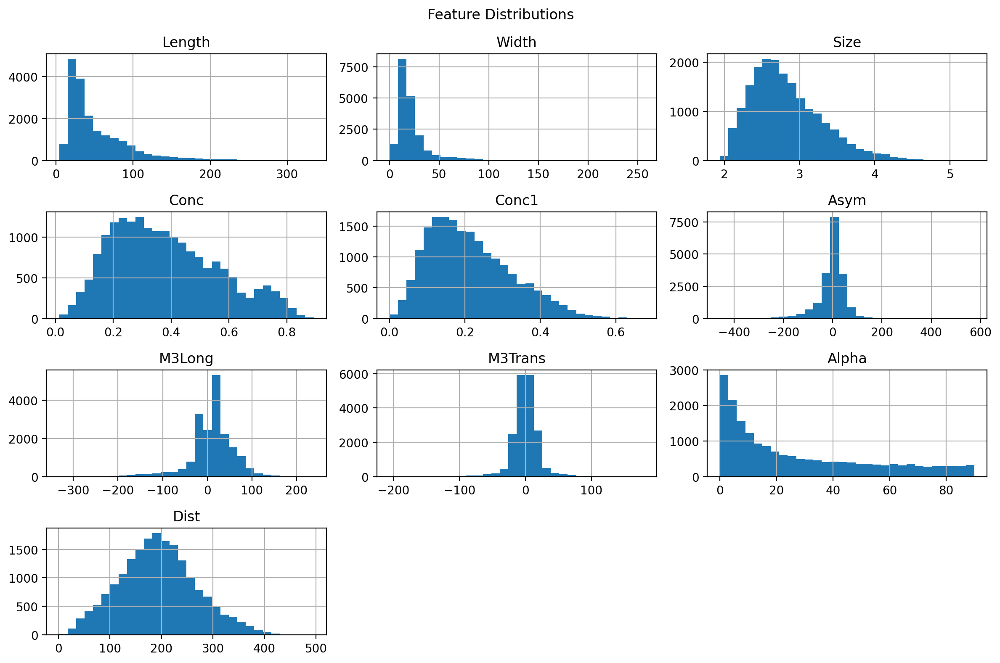

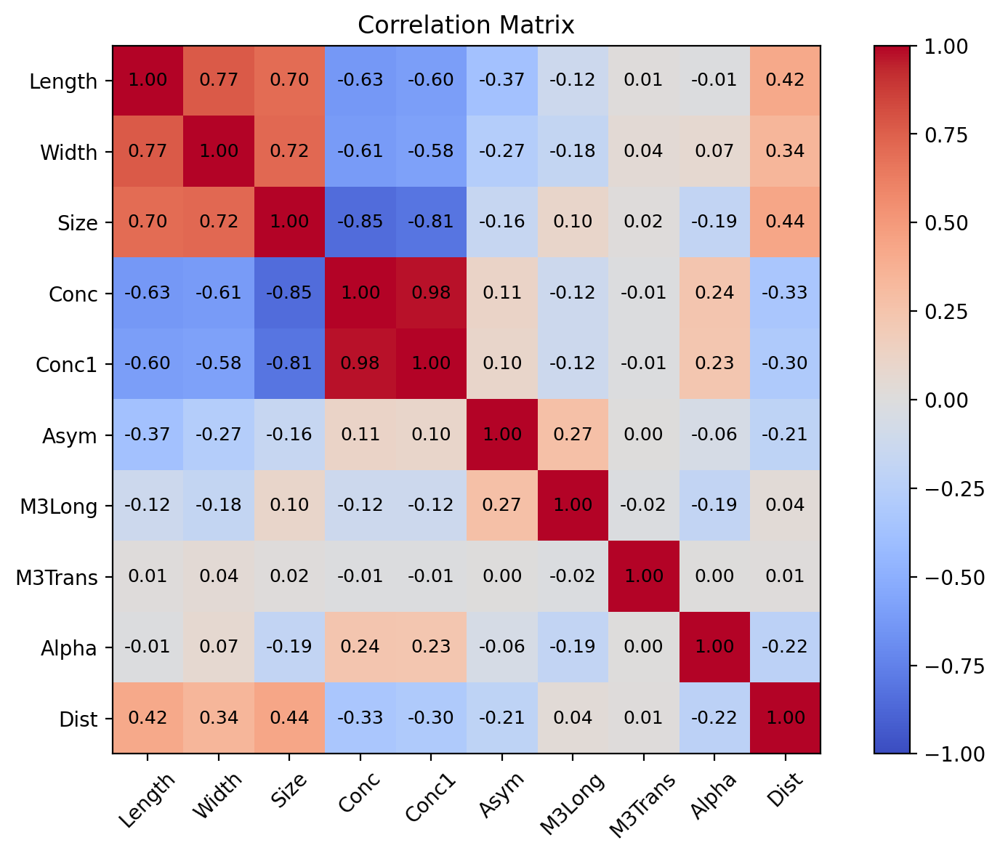

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def quick_eda(df: pd.DataFrame):
    print("BASIC INFO")
    print(df.info())

    print("\nSHAPE")
    print(df.shape)

    print("\nFIRST ROWS")
    print(df.head())

    print("\nMISSING VALUES")
    missing = df.isna().sum()
    print(missing[missing > 0] if missing.sum() > 0 else "No missing values")

    print("\nDUPLICATES")
    print("Duplicate rows:", df.duplicated().sum())

    print("\nNUMERIC STATS")
    print(df.describe())

    num_cols = df.select_dtypes(include=np.number).columns

    if len(num_cols) > 0:
        df[num_cols].hist(figsize=(12, 8), bins=30)
        plt.suptitle("Feature Distributions")
        plt.tight_layout()
        plt.show()
        corr = df[num_cols].corr()

        plt.figure(figsize=(8, 6))
        plt.imshow(corr, cmap="coolwarm", vmin=-1, vmax=1)
        plt.colorbar()

        plt.xticks(range(len(num_cols)), num_cols, rotation=45)
        plt.yticks(range(len(num_cols)), num_cols)

        for i in range(len(num_cols)):
            for j in range(len(num_cols)):
                plt.text(j, i, f"{corr.iloc[i, j]:.2f}",
                         ha="center", va="center", color="black", fontsize=9)

        plt.title("Correlation Matrix")
        plt.tight_layout()
        plt.show()

quick_eda(data)

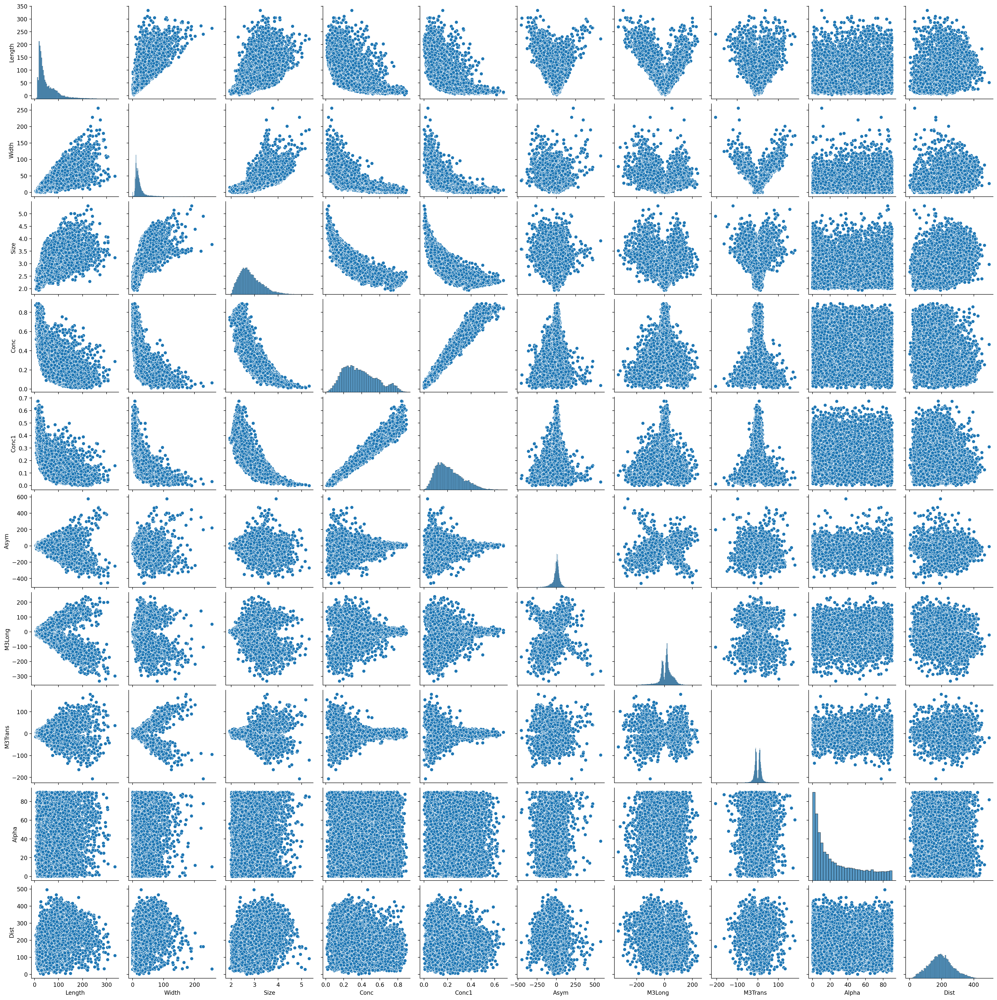

In [8]:
import seaborn as sns
sns.pairplot(data)

In [9]:
def plot_feature_importances(f_imps, f_names, title=""):
    f_imps = np.array(f_imps)
    f_names = np.array(f_names)
    sort_inds = np.argsort(f_imps)
    yy = np.arange(len(f_imps)).astype(int)
    plt.barh(yy, f_imps[sort_inds])
    plt.yticks(yy, f_names[sort_inds], size=14)
    plt.xticks(size=14)
    plt.xlabel("Feature importance", size=14)
    plt.title(title, size=14)
        
    # Add importance scores as labels on the horizontal bar chart
    for i, v in enumerate(f_imps[sort_inds]):
        plt.text(v + 0.01, i, str(round(v, 3)), color="black", fontweight="bold")
    plt.show()


## Оценка важности признаков

Оценка важности признаков сильно переплетена с методами интерпретации моделей. Так, существуют модели, интерпретируемые по определению (такие как линейная или дерево решений), для других моделей необходимо использовать внешние (post-hoc) методы.

При этом интерпретация разделяется еще и на локальную и глобальную. Первый тип отвечает на вопрос - как принимается решение для конкретного объекта, второй же - анализ модели в целом. В этом ноутбуке мы будем рассматривать именно данный тип интерпретации. 

Приложение полученных выводов может быть разным, в зависимости от предметной области. например:
 - какие показатели здоровья важны для отнесения пациента к той или иной группе
 - какие факторы влияют на вероятность выдачи кредита
 - как именно строится предпочтение пользователя в выборе фильма
итд


### Оценка признаков по определению

Классическая линейная модель имеет вид:

$y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_n x_n + \varepsilon$,

где каждый коэффициент $\beta_i$ показывает изменения отклика ;$y$ при увеличении признака $x_i$ на 1. Благодаря этому мы  явно можем количественно оценить важность каждого признака.

Логистическая модель описывает отношение шансов:

$log {{P(y=1)} \over {P(y=0)} }= \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_n x_n + \varepsilon$

где соответственно коэффициенты отражают вклад признака в изменение шансов.

Для деревьев решений оценка важности чуть сложнее.
На значимость каждого признака влияют:
- как часто признак использовался в правилах во внутренних узлах дерева
- какое число обучающих объектов прошло через узлы, использующие признак
- насколько правилам в этих узлах удавалось снизить неопределённость прогнозов

Пусть $T(f)$ все ноды, использующие фичу $f$ для разбиения. Tогда, важность фичи $Imp(f)$ of $f$:
    $$Imp(f) = \sum_{t \in T(f)} n_t \Delta I(t),$$
    $$\Delta I(t) = I(t) - \sum_{c \in children} \frac{n_c}{n_t} I(c),$$
где $n_{t}$ - число объектов в ноде $t$; $I(t)$ – impurity function (gini, cross-entropy, MSE) в ноде $t$

Величина $\Delta I(t)$ представляет собой среднее изменение неопределенности (impurity) при разбиении ноды $t$ по признаку $f$. Она вычисляется как разность между неопределенностью в родительской ноде $I(t)$ и взвешенной суммой неопределенностей в дочерних нодах. Важность признака $Imp(f)$ является взвешенной суммой средних изменений неопределенности по всем нодам, использующим этот признак для разбиения, где веса пропорциональны количеству объектов в каждой ноде. 

При этом лучше использовать этот метод не по единичному дереву, а по ансамблю, так как деревья склонны переобучаться при построении до самого конца (что нужно для рассчета). В случае ансамбля важности фичей усредняются между деревьями.


Рассмотрим пару примеров, на которых можно сравнить разные семейства и их интерпретацию.

In [17]:
from sklearn.datasets import make_classification

X_synth_clf, y_synth_clf = make_classification(
    n_samples=1000, n_features=5, n_informative=3, n_redundant=1, 
    n_clusters_per_class=1, random_state=42
)

X_synth_clf[:, 0] = X_synth_clf[:, 0] * 1000
X_synth_clf[:, 1] = X_synth_clf[:, 1] * 0.1
X_synth_clf[:, 2] = X_synth_clf[:, 2] * 100

feature_names_clf = [f'Feature_{i}' for i in range(X_synth_clf.shape[1])]

X_train_clf, X_test_clf, y_train_clf, y_test_clf = train_test_split(
    X_synth_clf, y_synth_clf, test_size=0.2, random_state=42
)


In [18]:
lr_clf_raw = LogisticRegression(max_iter=1000, random_state=42)
lr_clf_raw.fit(X_train_clf, y_train_clf)
lr_importance_clf_raw = np.abs(lr_clf_raw.coef_[0])

rf_clf_raw = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_raw.fit(X_train_clf, y_train_clf)
rf_importance_clf_raw = rf_clf_raw.feature_importances_

scaler_clf = StandardScaler()
X_train_clf_scaled = scaler_clf.fit_transform(X_train_clf)
X_test_clf_scaled = scaler_clf.transform(X_test_clf)

lr_clf_scaled = LogisticRegression(max_iter=1000, random_state=42)
lr_clf_scaled.fit(X_train_clf_scaled, y_train_clf)
lr_importance_clf_scaled = np.abs(lr_clf_scaled.coef_[0])

rf_clf_scaled = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_scaled.fit(X_train_clf_scaled, y_train_clf)
rf_importance_clf_scaled = rf_clf_scaled.feature_importances_


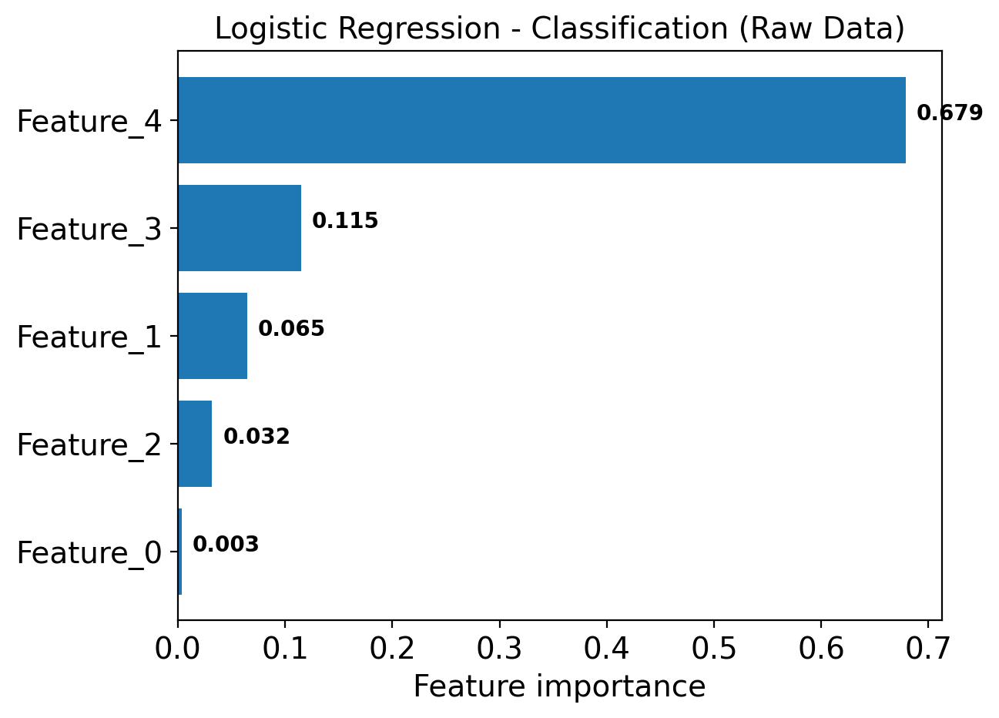

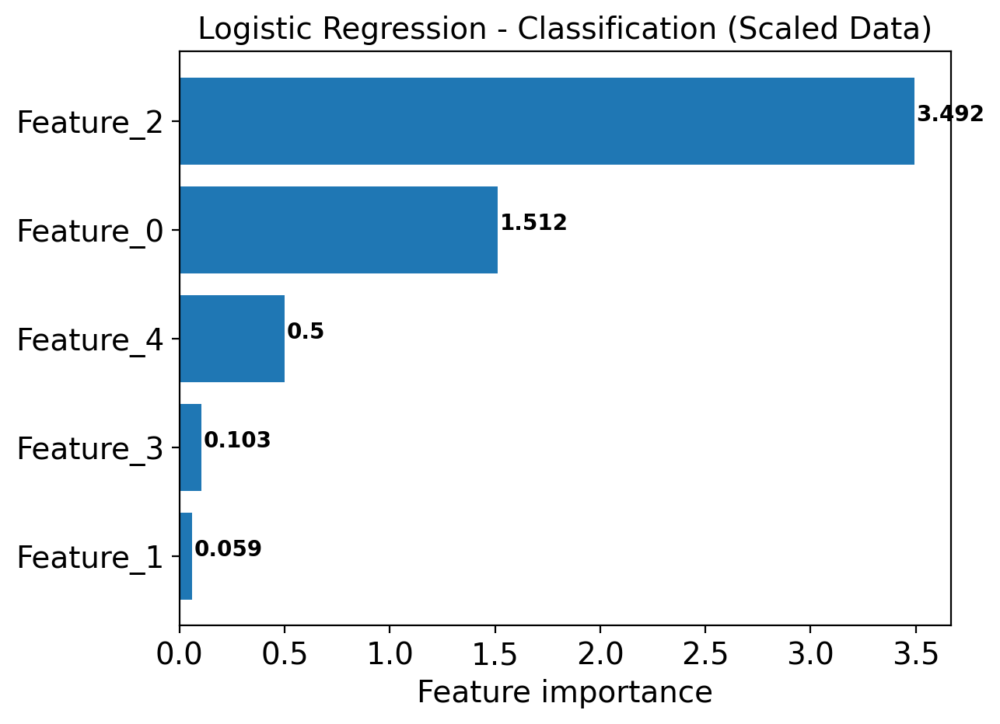

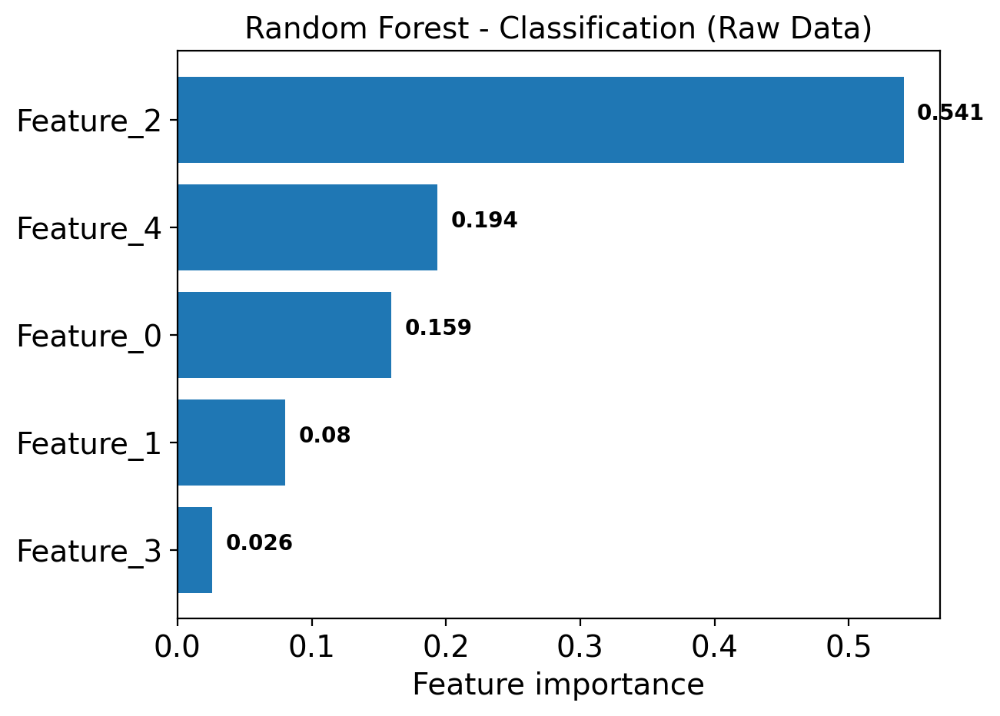

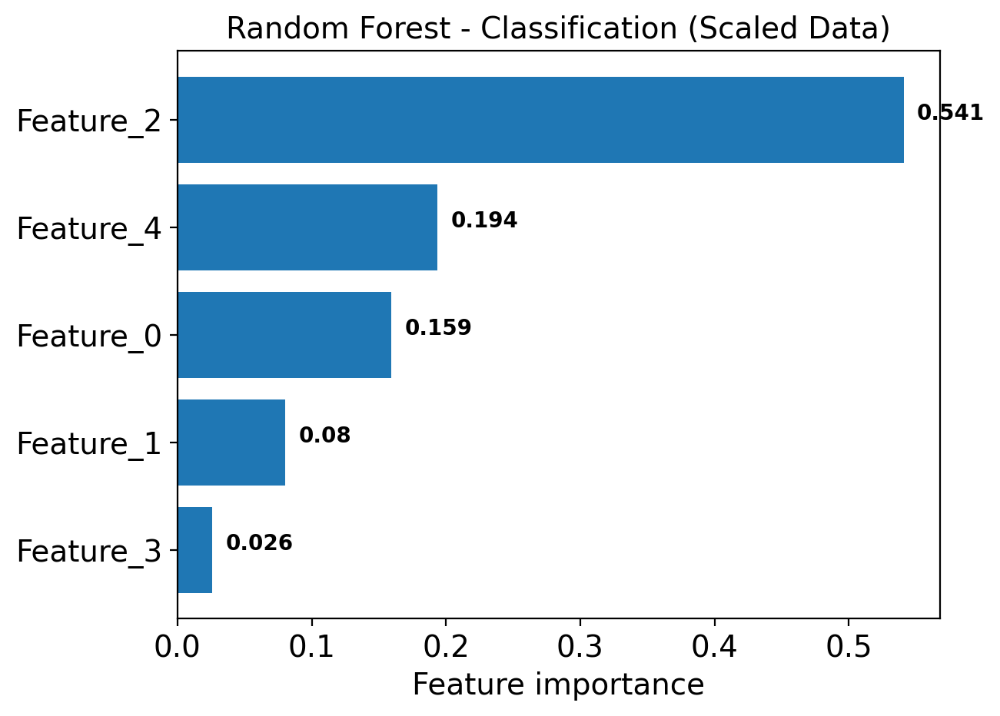

In [19]:
plot_feature_importances(lr_importance_clf_raw, feature_names_clf, 
                         title="Logistic Regression - Classification (Raw Data)")
plot_feature_importances(lr_importance_clf_scaled, feature_names_clf, 
                         title="Logistic Regression - Classification (Scaled Data)")
plot_feature_importances(rf_importance_clf_raw, feature_names_clf, 
                         title="Random Forest - Classification (Raw Data)")
plot_feature_importances(rf_importance_clf_scaled, feature_names_clf, 
                         title="Random Forest - Classification (Scaled Data)")


In [20]:
from sklearn.datasets import make_regression

X_synth_reg, y_synth_reg = make_regression(
    n_samples=1000, n_features=5, n_informative=3, noise=10, random_state=42
)
feature_names_reg = [f'Feature_{i}' for i in range(X_synth_reg.shape[1])]

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_synth_reg, y_synth_reg, test_size=0.2, random_state=42
)

lr_reg_raw = LinearRegression()
lr_reg_raw.fit(X_train_reg, y_train_reg)
lr_importance_reg_raw = np.abs(lr_reg_raw.coef_)

rf_reg_raw = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg_raw.fit(X_train_reg, y_train_reg)
rf_importance_reg_raw = rf_reg_raw.feature_importances_

scaler_reg = StandardScaler()
X_train_reg_scaled = scaler_reg.fit_transform(X_train_reg)
X_test_reg_scaled = scaler_reg.transform(X_test_reg)

lr_reg_scaled = LinearRegression()
lr_reg_scaled.fit(X_train_reg_scaled, y_train_reg)
lr_importance_reg_scaled = np.abs(lr_reg_scaled.coef_)

rf_reg_scaled = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg_scaled.fit(X_train_reg_scaled, y_train_reg)
rf_importance_reg_scaled = rf_reg_scaled.feature_importances_


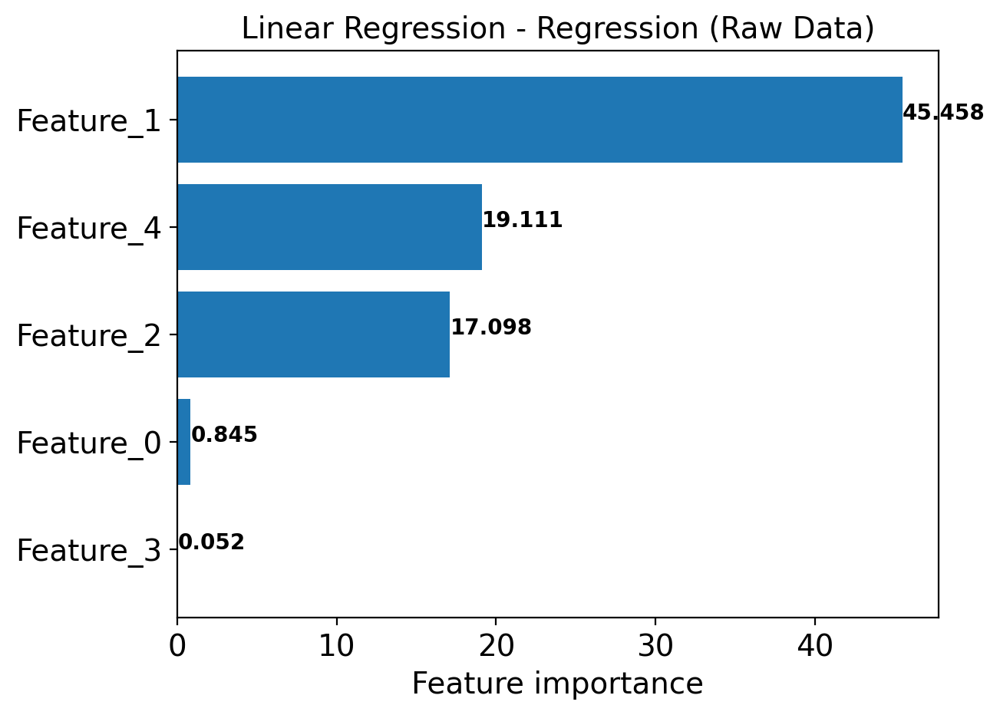

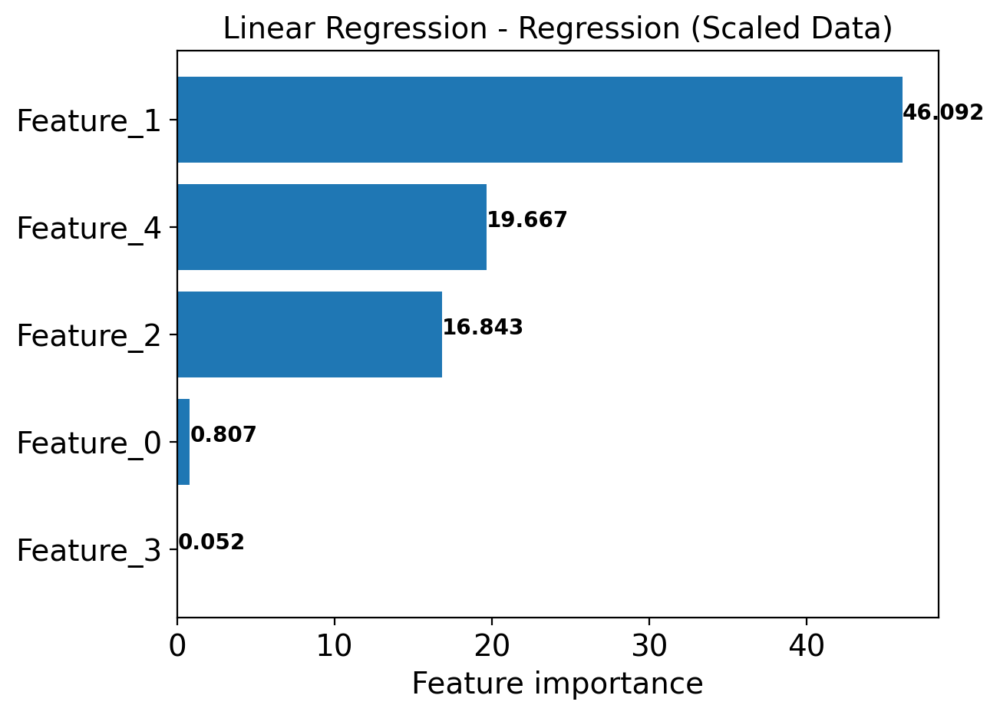

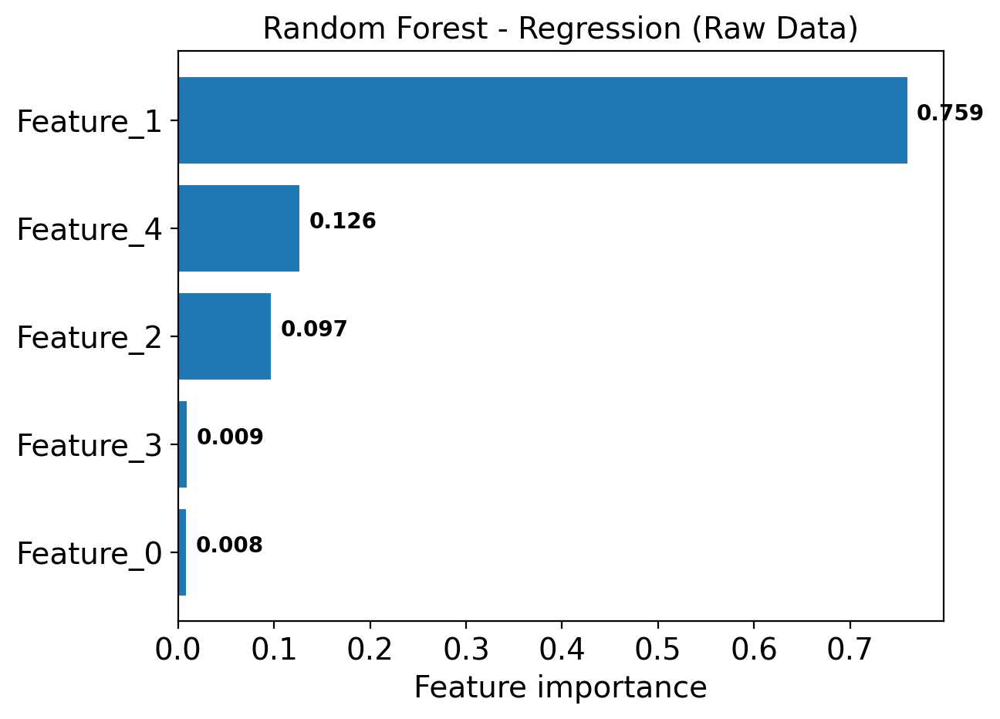

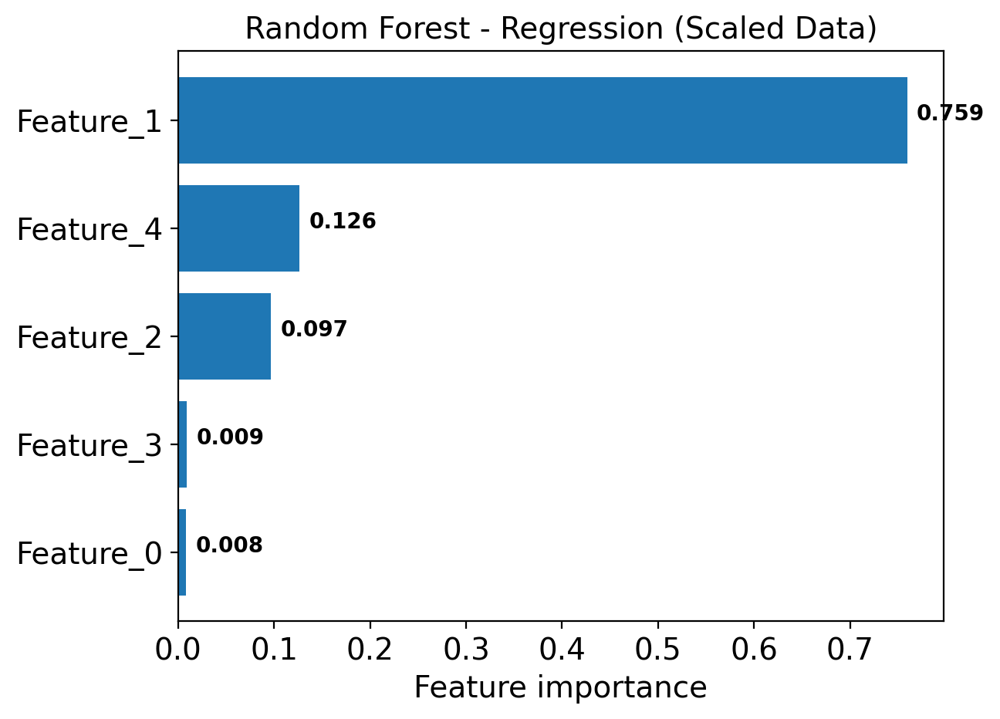

In [21]:
plot_feature_importances(lr_importance_reg_raw, feature_names_reg, 
                         title="Linear Regression - Regression (Raw Data)")
plot_feature_importances(lr_importance_reg_scaled, feature_names_reg, 
                         title="Linear Regression - Regression (Scaled Data)")
plot_feature_importances(rf_importance_reg_raw, feature_names_reg, 
                         title="Random Forest - Regression (Raw Data)")
plot_feature_importances(rf_importance_reg_scaled, feature_names_reg, 
                         title="Random Forest - Regression (Scaled Data)")


### Пример на датасете MAGIC


In [22]:
lr_magic_raw = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_raw.fit(X_train, y_train)
lr_importance_magic_raw = np.abs(lr_magic_raw.coef_[0])

rf_magic_raw = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_raw.fit(X_train, y_train)
rf_importance_magic_raw = rf_magic_raw.feature_importances_

scaler_magic = StandardScaler()
X_train_magic_scaled = scaler_magic.fit_transform(X_train)
X_test_magic_scaled = scaler_magic.transform(X_test)

lr_magic_scaled = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_scaled.fit(X_train_magic_scaled, y_train)
lr_importance_magic_scaled = np.abs(lr_magic_scaled.coef_[0])

rf_magic_scaled = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_scaled.fit(X_train_magic_scaled, y_train)
rf_importance_magic_scaled = rf_magic_scaled.feature_importances_


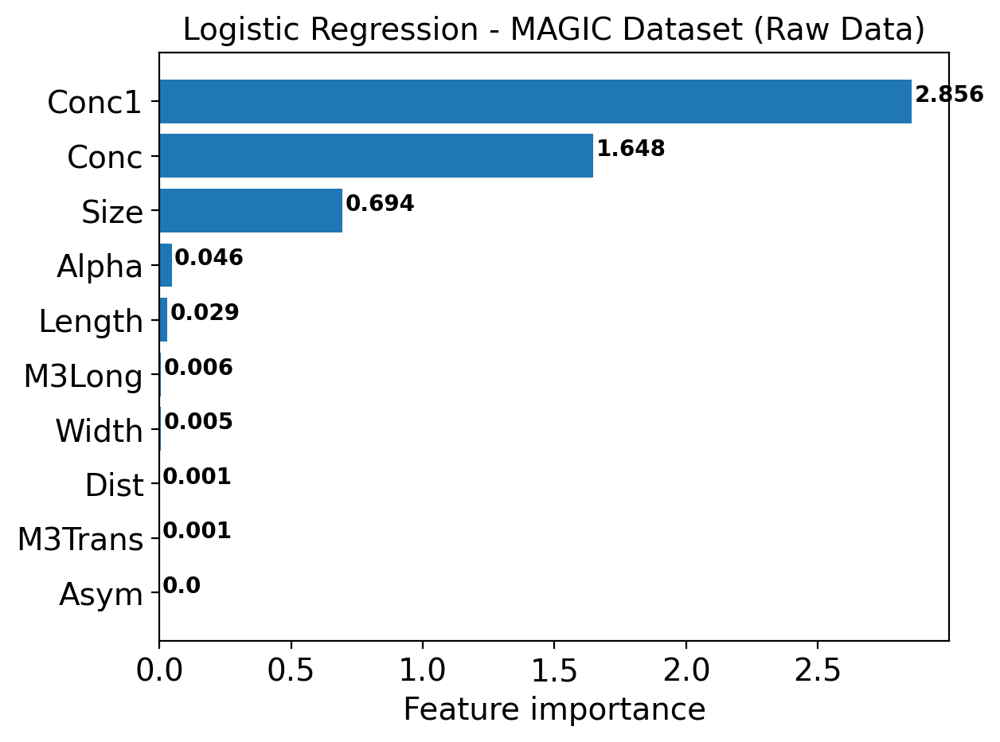

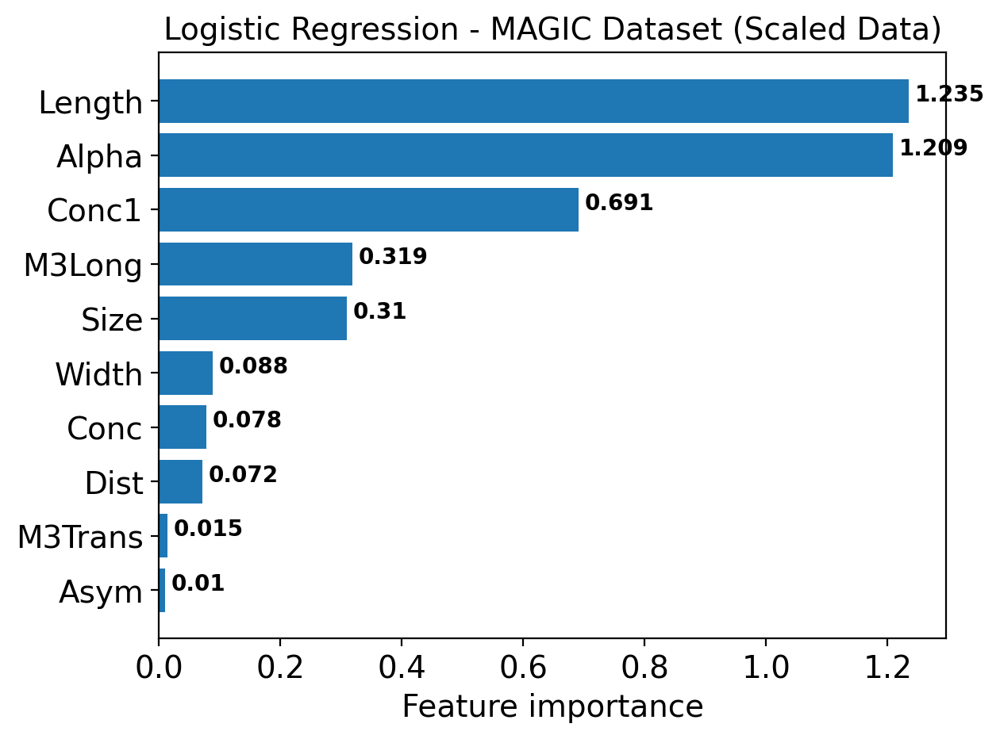

In [23]:
plot_feature_importances(lr_importance_magic_raw, columns, 
                         title="Logistic Regression - MAGIC Dataset (Raw Data)")
plot_feature_importances(lr_importance_magic_scaled, columns, 
                         title="Logistic Regression - MAGIC Dataset (Scaled Data)")


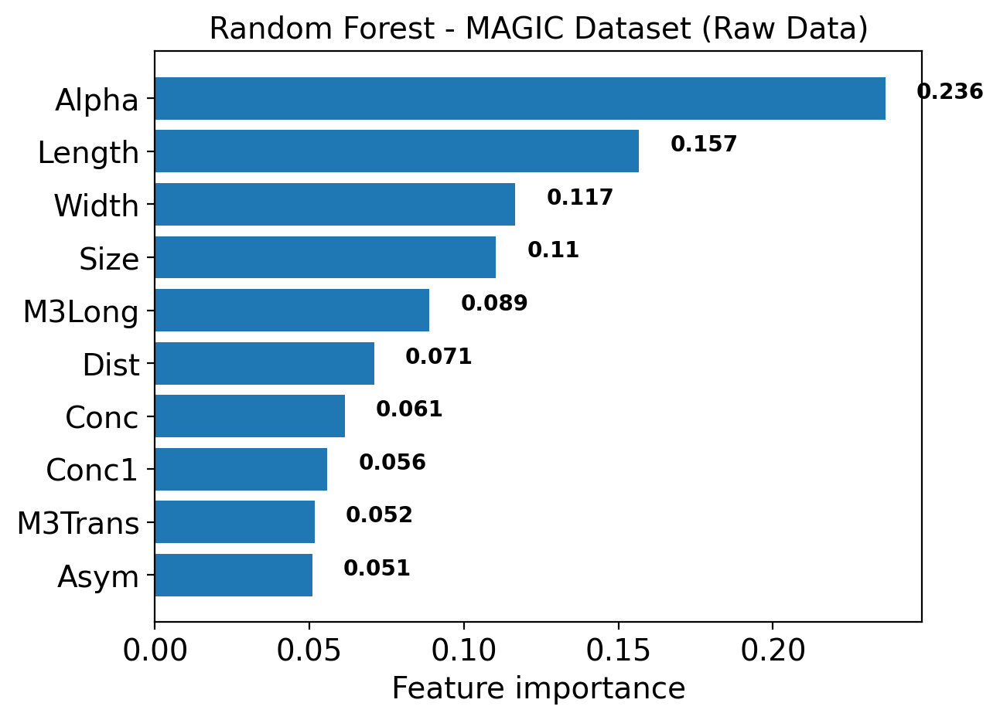

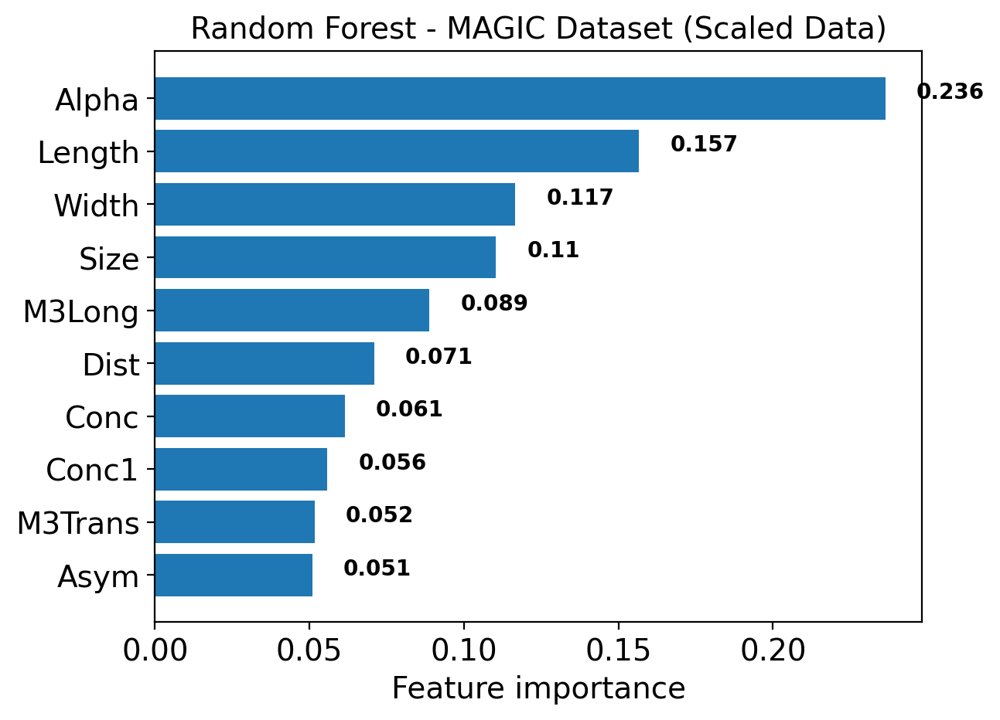

In [24]:

plot_feature_importances(rf_importance_magic_raw, columns, 
                         title="Random Forest - MAGIC Dataset (Raw Data)")
plot_feature_importances(rf_importance_magic_scaled, columns, 
                         title="Random Forest - MAGIC Dataset (Scaled Data)")

Вопрос: какие из этих признаков можно считать важными? 

Ответ: Наиболее важными признаками можно считать Alpha и Length, так как они стабильно имеют наибольшую значимость в разных моделях. Также заметную, но меньшую важность имеют Conc1 и Conc, тогда как остальные признаки в основном играют слабую роль.

## Model-agnostic methods

###  Information gain 
Самый простой способ выбора признаков - Information gain (прирост информации). 

Энтропия целевой переменной Y:
$$H(Y) = -\sum_{i=1}^{c} p(y_i) \log_2 p(y_i)$$
где:
$c$ — число классов
$p(y_i)$ — вероятность класса $y_i$

Условная энтропия Y при известном признаке X:
$$H(Y|X) = -\sum_{j=1}^{m} p(x_j) \sum_{i=1}^{c} p(y_i|x_j) \log_2 p(y_i|x_j)$$
где:
$m$ — число значений признака X
$p(x_j)$ — вероятность значения $x_j$
$p(y_i|x_j)$ — условная вероятность класса $y_i$ при значении $x_j$

Прирост информации - (I(X , Y) = H(X) – H(X | Y)). Это статистика, которая измеряет снижение энтропии (неопределенности) для конкретной функции (таргета) путем деления данных в соответствии с этой характеристикой. 


Она часто используется в алгоритмах дерева решений, а также имеет другие полезные свойства. Чем выше прирост информации от признака использования признака, тем полезнее он для принятия решений.

Для дискретных признаков необходимо следующее:
1. Вычислить энтропию целевой переменной: $H(Y)$
2. Для каждого признака $X$:
   1. Разделить данные по значениям $X$
   2. Вычислить условную энтропию $H(Y|X)$
   3. Вычислить $IG(Y, X) = H(Y) - H(Y|X)$

Вопрос: что дальше необходимо сделать, если это происходит во время построения дерева решений?

Для непрерывных признаков сначала необходимо провести дискретизацию(бининг). 

Вопросы: 
 1) зависит ли результат от масштаба данных?
 2) требует ли такое вычисление каких-то знаний о распределениях в данных? Является ли он параметрическим?

 В чем проблема этого метода - IG может быть выше для признаков с множеством уникальных значений, соответственно, и оценка важности будет смещена. Кроме того, никак не учитывается их взаимодействие. 

Для снижения смещения к признакам с большим числом значений используется Information Gain Ratio:
$$IGR(Y, X) = \frac{IG(Y, X)}{H(X)} = \frac{H(Y) - H(Y|X)}{H(X)}$$
Нормализует IG на энтропию признака, уменьшая влияние признаков с высокой энтропией.

В sklearn можно оценить важность признаков с помощью mutual_info_regression.


In [25]:
# Apply Information Gain
ig = mutual_info_regression(X_train, y_train)

# Create a dictionary of feature importance scores
feature_scores = {}
for i, col in enumerate(list(columns)):
    feature_scores[col ] = ig[i]

# Sort the features by importance score in descending order
sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)

# Print the feature importance scores and the sorted features
for feature, score in sorted_features:
    print(f"Feature: {feature}, Score: {score}")

Feature: Alpha, Score: 0.12081558898534972
Feature: Width, Score: 0.09214428047991774
Feature: Length, Score: 0.07523458673562722
Feature: M3Long, Score: 0.06968209387404833
Feature: M3Trans, Score: 0.061373721653209756
Feature: Asym, Score: 0.038967588345906634
Feature: Size, Score: 0.0365882430693496
Feature: Conc1, Score: 0.014365063863428063
Feature: Conc, Score: 0.011364629503479051
Feature: Dist, Score: 0.011025457077476375


### F-test

F-test (F-тест) — это статистический метод для оценки важности признаков, основанный на проверке статистических гипотез. Он сравнивает две модели: нулевую модель (только константа) и альтернативную модель (константа + признак), чтобы определить, вносит ли признак значимый вклад в объяснение целевой переменной.


F-test для оценки важности признаков основан на сравнении дисперсий остатков двух моделей [https://online.stat.psu.edu/stat501/lesson/2/2.6]:

1. **Нулевая модель (H₀)**: $y = \beta_0 + \epsilon$ — модель только с константой (средним значением)
2. **Альтернативная модель (H₁)**: $y = \beta_0 + \beta_1 x_i + \epsilon$ — модель с константой и признаком $x_i$

Идея заключается в том, что если признак $x_i$ действительно важен, то добавление его в модель должно значительно уменьшить сумму квадратов остатков: 

SSR - regression sum of squares. Это сумма квадратов отклонений, объясненная моделью. $SSR = \sum_{i=1}^{n}(\hat{y}i - \bar{y})^2$

SSE - сумма квадратов ошибок (необъяснённая)ю $SSE = \sum_{i=1}^{n}(y_i - \hat{y}i)^2$

$MSE = {SSE \over(n-2)}$ ( т.к. два параметра - коэффициенты при свободном члене и признаке)

SSTO = SSR + SSE: $SSTO = \sum_{i=1}^{n}(y_i - \bar{y})^2$

$ F = {MSR \over {MSE}} = {{SSR} \over {SSE \ (n-2)}} = {{SSR (n - 2)} \over {SSE}} = {(n - 2){\sum (\hat{y}_i - \overline{y} )^2 } \over {{\sum (\hat{y}_i - y_i )^2 }}} $.


F-статистика следует F-распределению с степенями свободы $(1, n-2)$ при справедливости нулевой гипотезы. Т.е.:
- **Высокая F-статистика** и **низкий p-value** (< 0.05) указывают на то, что признак статистически значим и вносит важный вклад в модель
- **Низкая F-статистика** и **высокий p-value** (> 0.05) указывают на то, что признак не является значимым


Признаки ранжируются по убыванию F-статистики или по возрастанию p-value. Кроме того, можно выполнять последовательный тест, сначала найдя важности всех признаков по одному, сравнивая $M0$ и $M1$, далее, выбрав лучшую фичу, использовать $M1$ как базовую модель и создавать уже $M2$ со всем и остальными фичами, и так далее..


Если мы знаем $r^2$, то мы можем посчитать F исходя из него:
$r^2 = SSR / SSTO => 1 - r^2 = SSE / SSTO $

$E[(X_i - mean(X_i)) * (y - mean(y))] / (std(X_i) * std(y))$ 

Тогда:
$$F = \frac{r^2}{1 - r^2} \cdot (n - 2)$$

В простой линейной регрессии коэффициент детерминации равен квадрату коэффициента корреляции. Это означает, что F-test по сути проверяет значимость линейной корреляции между признаком и целевой переменной.

Исходя из вышеперечисленного, какие недостатки у этого метода?


Ответ:Главный недостаток F-test в том, что он оценивает каждый признак по отдельности и только в рамках линейной зависимости, поэтому не учитывает взаимодействия между признаками и может недооценивать важные переменные, которые работают в комбинации с другими. Кроме того, он чувствителен к выбросам и шуму, а также плохо работает при нарушении предположений о нормальности и гомоскедастичности ошибок, что делает его менее надёжным в реальных данных.


F-test результаты для датасета MAGIC:
Feature: Alpha                F-statistic:    2642.33 p-value: 0.00e+00 ***
Feature: Length               F-statistic:     988.38 p-value: 1.74e-206 ***
Feature: Width                F-statistic:     697.80 p-value: 1.87e-148 ***
Feature: M3Long               F-statistic:     366.94 p-value: 2.79e-80 ***
Feature: Asym                 F-statistic:     286.07 p-value: 2.99e-63 ***
Feature: Size                 F-statistic:     136.18 p-value: 2.98e-31 ***
Feature: Dist                 F-statistic:      41.61 p-value: 1.17e-10 ***
Feature: Conc                 F-statistic:       4.27 p-value: 3.87e-02 *
Feature: M3Trans              F-statistic:       0.36 p-value: 5.47e-01 
Feature: Conc1                F-statistic:       0.00 p-value: 9.52e-01 


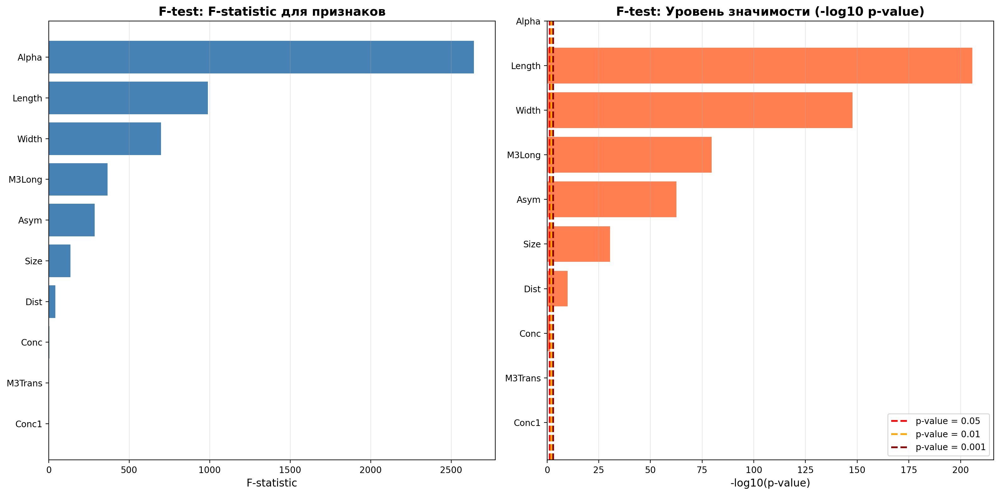


Количество значимых признаков (p-value < 0.05): 8
Количество высокозначимых признаков (p-value < 0.01): 7
Количество очень высокозначимых признаков (p-value < 0.001): 7


In [26]:
f_statistic, p_values = f_classif(X_train, y_train)
feature_scores = {}
for i, col in enumerate(list(columns)):
    feature_scores[col] = (f_statistic[i], p_values[i])

sorted_features = sorted(
    feature_scores.items(), key=lambda x: x[1][0], reverse=True
)

print("F-test результаты для датасета MAGIC:")
print("=" * 60)
for feature, score in sorted_features:
    significance = "***" if score[1] < 0.001 else "**" if score[1] < 0.01 else "*" if score[1] < 0.05 else ""
    print(f"Feature: {feature:20s} F-statistic: {score[0]:10.2f} p-value: {score[1]:.2e} {significance}")

ftest_df = pd.DataFrame({
    'Feature': [f[0] for f in sorted_features],
    'F-statistic': [f[1][0] for f in sorted_features],
    'p-value': [f[1][1] for f in sorted_features]
})

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

y_pos = np.arange(len(ftest_df))
ax1.barh(y_pos, ftest_df['F-statistic'], color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(ftest_df['Feature'])
ax1.set_xlabel('F-statistic', fontsize=12)
ax1.set_title('F-test: F-statistic для признаков', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

ax2.barh(y_pos, -np.log10(ftest_df['p-value']), color='coral')
ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', linewidth=2, label='p-value = 0.05')
ax2.axvline(x=-np.log10(0.01), color='orange', linestyle='--', linewidth=2, label='p-value = 0.01')
ax2.axvline(x=-np.log10(0.001), color='darkred', linestyle='--', linewidth=2, label='p-value = 0.001')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(ftest_df['Feature'])
ax2.set_xlabel('-log10(p-value)', fontsize=12)
ax2.set_title('F-test: Уровень значимости (-log10 p-value)', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.legend()
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nКоличество значимых признаков (p-value < 0.05): {sum(ftest_df['p-value'] < 0.05)}")
print(f"Количество высокозначимых признаков (p-value < 0.01): {sum(ftest_df['p-value'] < 0.01)}")
print(f"Количество очень высокозначимых признаков (p-value < 0.001): {sum(ftest_df['p-value'] < 0.001)}")

F-test также может использоваться для задач регрессии с помощью функции `f_regression`.


Вопрос: Какие из столбцов можно считать важными, основываясь на этом тесте? Поясните свой ответ

Ответ: По F-test важными признаками считаются Alpha, Length, Width, M3Long, Asym, Size и Dist, так как у них очень высокие F-статистики и почти нулевые p-value, что говорит о сильной связи с целевой переменной. Conc можно считать слабо значимым, а M3Trans и Conc1 - незначимыми, так как их p-value высокие и статистически значимого вклада они не дают.

Задание: 
1) Постройте модель логистической регрессии, используя все признаки из набора.
2) Также постройте модели для выбранных наборов признаков. 
3) Сравните модели по точности, используя кросс-валидацию. 

In [29]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

col_to_idx = {c: i for i, c in enumerate(columns)}


def run_cv(X_data):
    model = make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=2000, solver="lbfgs", random_state=42)
    )

    scores = cross_val_score(
        model,
        X_data,
        y_train,
        cv=cv_strategy,
        scoring="roc_auc"
    )

    return scores.mean(), scores.std()


experiments = [
    ("all features", X_train),

    ("f-test top 6", X_train[:, [col_to_idx[c] for c in
        ["Alpha", "Length", "Width", "M3Long", "Asym", "Size"]]]),

    ("without weak features", X_train[:, [col_to_idx[c] for c in
        [c for c in columns if c not in {"Conc", "Conc1", "M3Trans", "Dist"}]]]),

    ("domain based", X_train[:, [col_to_idx[c] for c in
        ["Alpha", "Length", "Width", "Conc", "Conc1", "Size"]]]),

    ("minimal set", X_train[:, [col_to_idx[c] for c in
        ["Alpha", "Length", "Width"]]]),
]


print(f"{'model':25s} {'auc':>10s} {'std':>10s}")
print("-" * 50)

for name, X in experiments:
    mean_auc, std_auc = run_cv(X)
    print(f"{name:25s} {mean_auc:10.4f} {std_auc:10.4f}")

model                            auc        std
--------------------------------------------------
all features                  0.8419     0.0048
f-test top 6                  0.8251     0.0022
without weak features         0.8251     0.0022
domain based                  0.8390     0.0037
minimal set                   0.8193     0.0007


Задание: Покажите, как будет меняться оценка важности признаков линейной модели при добавлении выбросов и нелинейных зависимостей. Сравните с оценкой по коэффициентам.

In [31]:
import numpy as np
import pandas as pd
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

col_to_idx = {c: i for i, c in enumerate(columns)}

def get_importance(X, y, feature_names):
    model = make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=2000)
    )

    model.fit(X, y)

    coefs = np.abs(model.named_steps["logisticregression"].coef_[0])
    return pd.Series(coefs, index=feature_names)


def print_block(name, series):
    print(f"\n{name}")
    print(series.sort_values(ascending=False).round(4).to_string())

base = get_importance(X_train, y_train, columns)
print_block("baseline model", base)

X_out = X_train.copy()

rng = np.random.default_rng(42)
n_out = int(0.03 * len(X_out))
idx = rng.choice(len(X_out), n_out, replace=False)

X_out[idx, 0] *= rng.uniform(5, 15, n_out)
X_out[idx, 1] *= rng.uniform(5, 12, n_out)
X_out[idx, 2] *= rng.uniform(4, 10, n_out)

out = get_importance(X_out, y_train, columns)
print_block("after adding outliers", out)


alpha_idx = col_to_idx["Alpha"]

X_nonlin = np.hstack([
    X_train,
    (X_train[:, alpha_idx] ** 2).reshape(-1, 1)
])

cols_nonlin = list(columns) + ["Alpha^2"]

nonlin = get_importance(X_nonlin, y_train, cols_nonlin)
print_block("after adding nonlinear feature", nonlin)


baseline model
Length     1.2349
Alpha      1.2090
Conc1      0.6911
M3Long     0.3187
Size       0.3098
Width      0.0882
Conc       0.0781
Dist       0.0716
M3Trans    0.0145
Asym       0.0100

after adding outliers
Alpha      1.2060
Conc       1.0445
Conc1      0.9756
Length     0.8579
Size       0.7657
Width      0.3088
Dist       0.2794
M3Long     0.2342
Asym       0.1616
M3Trans    0.0071

after adding nonlinear feature
Alpha      3.2365
Alpha^2    1.9451
Length     1.3371
Conc1      0.6317
Size       0.5254
M3Long     0.3274
Dist       0.1699
Width      0.1154
Conc       0.0273
Asym       0.0191
M3Trans    0.0096


In [32]:
def print_feature_names(features, original_feature_names: list  | None = None):
  feature_names = [str(original_feature_names[int(f.strip("pixel"))]) for f in features]
  print(f"Selected features: {feature_names}")


def select_features(X_train, y_train, X_test, function, k: int = 5, features: list  | None = None):
 # configure to select a subset of features
 fs = SelectKBest(score_func=function, k=k)
 fs.fit(X_train, y_train)
 print_feature_names(fs.get_feature_names_out(), features)
 X_train_fs = fs.transform(X_train)
 X_test_fs = fs.transform(X_test)
 return X_train_fs, X_test_fs, fs

In [36]:
model = DecisionTreeClassifier(random_state=42)

score = cross_val_score(model, X_train, y_train, cv=5, scoring="accuracy").mean()
print(score)

0.8082018927444794


In [38]:
results = {"num_features": [], "acc": [], "roc_auc": []}
for i in range(1, len(columns)):
    results["num_features"].append(i)
    # feature selection
    X_train_fs, X_test_fs, fs = select_features(
        X_train, y_train, X_test, f_classif, k=i, features = list(columns)
        )
    # fit the model
    model = DecisionTreeClassifier()
    model.fit(X_train_fs, y_train)
    # evaluate the model
    yhat = model.predict(X_test_fs)
    probs = model.predict_proba(X_test_fs)[:, 1]
    # evaluate predictions
    results["acc"].append(accuracy_score(y_test, yhat))
    results["roc_auc"].append(roc_auc_score(y_test, probs))
results = pd.DataFrame(results)

Selected features: ['Alpha']
Selected features: ['Length', 'Alpha']
Selected features: ['Length', 'Width', 'Alpha']
Selected features: ['Length', 'Width', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Asym', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Size', 'Asym', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Size', 'Asym', 'M3Long', 'Alpha', 'Dist']
Selected features: ['Length', 'Width', 'Size', 'Conc', 'Asym', 'M3Long', 'Alpha', 'Dist']
Selected features: ['Length', 'Width', 'Size', 'Conc', 'Asym', 'M3Long', 'M3Trans', 'Alpha', 'Dist']


In [39]:
results

,num_features,acc,roc_auc
0,1,0.654890,0.623853
1,2,0.744059,0.721604
2,3,0.770137,0.749037
3,4,0.784753,0.765304
4,5,0.783807,0.765942
5,6,0.804942,0.786963
6,7,0.807886,0.791218
7,8,0.811672,0.793248
8,9,0.810515,0.792493


**Задание**: Реализуйте такой метод, используя линейную модель с регуляризацией.

In [41]:
import numpy as np
from sklearn.metrics import accuracy_score

def get_feature_imp_general(X_test, y_test, model, metric=accuracy_score):
    feature_importances = []

    y_pred = model.predict(X_test)
    base_score = metric(y_test, y_pred)

    for i in range(X_test.shape[1]):

        X_perm = X_test.copy()

        np.random.shuffle(X_perm[:, i])

        X_perm = np.nan_to_num(X_perm)

        y_hat = model.predict(X_perm)
        perm_score = metric(y_test, y_hat)

        importance = base_score - perm_score
        feature_importances.append(importance)

    return np.array(feature_importances)

**Бонусное задание**: Сделайте метрику аргументом, проведите тесты с линейной моделью, деревом решений, случайным лесом, двумя метриками. Постройте таблицу со сравнением.

In [42]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


models = {
    "logreg": make_pipeline(StandardScaler(), LogisticRegression(max_iter=2000)),
    "tree": DecisionTreeClassifier(random_state=42),
    "rf": RandomForestClassifier(n_estimators=100, random_state=42)
}

metrics = {
    "accuracy": accuracy_score,
    "roc_auc": roc_auc_score
}

results = []

for m_name, model in models.items():

    model.fit(X_train, y_train)

    for metric_name, metric in metrics.items():

        if metric_name == "roc_auc":
            y_pred = model.predict_proba(X_test)[:, 1]
            score = metric(y_test, y_pred)
        else:
            y_pred = model.predict(X_test)
            score = metric(y_test, y_pred)

        importances = get_feature_imp_general(
            X_test, y_test, model, metric=metric
        )

        results.append({
            "model": m_name,
            "metric": metric_name,
            "score": score,
            "mean_importance": np.mean(importances)
        })

df_results = pd.DataFrame(results)
print(df_results)

    model    metric     score  mean_importance
0  logreg  accuracy  0.791693         0.030841
1  logreg   roc_auc  0.836769         0.029611
2    tree  accuracy  0.810936         0.085499
3    tree   roc_auc  0.792954         0.072032
4      rf  accuracy  0.870662         0.052787
5      rf   roc_auc  0.931618         0.040330


### Permutation Importance

**Permutation Importance** измеряет важность признака как ухудшение производительности модели при случайном перемешивании значений этого признака. Если признак важен, его перемешивание должно значительно снизить качество предсказаний модели.

Математически, для признака $f$ важность определяется как:

$$Imp(f) = Q_0 - Q_f$$

где:
- $Q_0$ — базовая метрика качества модели на исходных данных
- $Q_f$ — метрика качества модели после перемешивания значений признака $f$


Как видно, для разных моделей оценки сильно отличаются. 
Общий метод оценки важности: 
1) Обучите свою модель
2) Рассчитайте метрику качества  $Q_o$  на тестовом наборе
3) Для признака $f$:
     1) Замените значения случайными значениями из того же распределения (выполните случайное перемешивание)
     2) Рассчитайте метрику качества $Q_r$ на тестовом наборе 
     3) Оцените важность признака: $Imp(f) = Q_0 - Q_r$


Для получения более стабильной оценки процесс повторяется $n$ раз (обычно $n=5$ или $n=10$), и берется среднее значение:

$$Imp(f) = \frac{1}{n} \sum_{i=1}^{n} (Q_0 - Q_{f,i})$$

где $Q_{f,i}$ — метрика качества после $i$-го перемешивания признака $f$.

In [43]:

def plot_permutation_importance(model, X_test, y_test, feature_names, 
                                n_repeats=10, random_state=42, scoring='accuracy', 
                                n_jobs=-1, title='', xlabel='Permutation Importance', 
                                color='steelblue', figsize=(10, 6), show_plot=True):
    perm_importance = permutation_importance(
        model, X_test, y_test,
        n_repeats=n_repeats, random_state=random_state, scoring=scoring, n_jobs=n_jobs
    )
    
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': perm_importance.importances_mean,
        'Std': perm_importance.importances_std
    }).sort_values('Importance', ascending=False)
    
    if show_plot:
        fig, ax = plt.subplots(figsize=figsize)
        y_pos = np.arange(len(importance_df))
        ax.barh(y_pos, importance_df['Importance'], xerr=importance_df['Std'], 
                capsize=5, color=color)
        ax.set_yticks(y_pos)
        ax.set_yticklabels(importance_df['Feature'])
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.invert_yaxis()
        plt.tight_layout()
        plt.show()
    
    return importance_df

Классификация на синтетических данных:


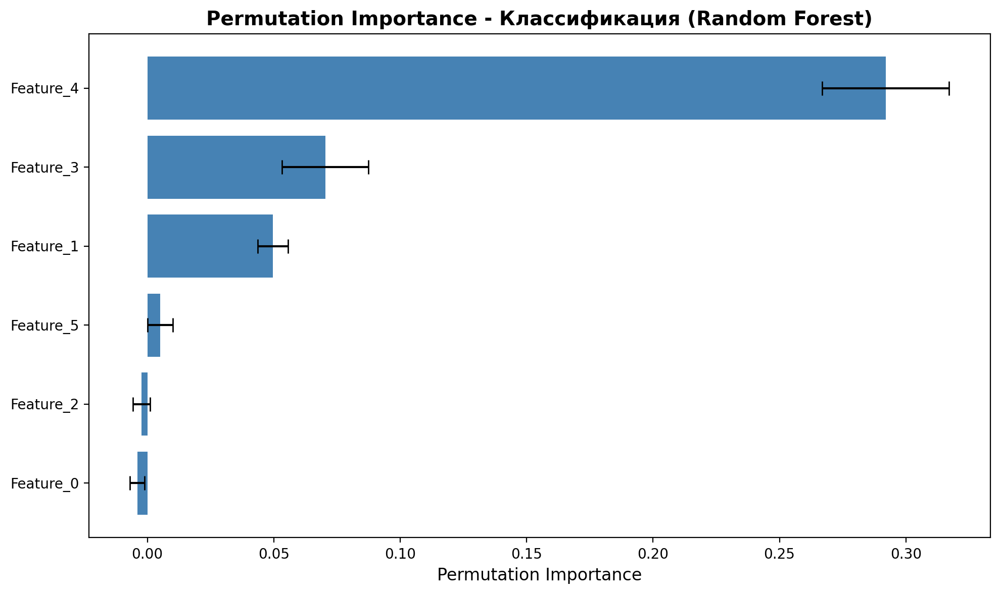

Permutation Importance для классификации:
     Feature  Importance       Std
4  Feature_4    0.292000  0.025131
3  Feature_3    0.070333  0.017026
1  Feature_1    0.049667  0.006046
5  Feature_5    0.005000  0.005000
2  Feature_2   -0.002333  0.003350
0  Feature_0   -0.004000  0.002906


In [44]:
from sklearn.datasets import make_classification

X_synth_clf_perm, y_synth_clf_perm = make_classification(
    n_samples=1000, n_features=6, n_informative=3, n_redundant=1,
    n_clusters_per_class=1, random_state=42
)

X_train_clf_perm, X_test_clf_perm, y_train_clf_perm, y_test_clf_perm = train_test_split(
    X_synth_clf_perm, y_synth_clf_perm, test_size=0.3, random_state=42
)

rf_clf_perm = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_perm.fit(X_train_clf_perm, y_train_clf_perm)

feature_names_clf_perm = [f'Feature_{i}' for i in range(X_synth_clf_perm.shape[1])]
importance_df_clf = plot_permutation_importance(
    rf_clf_perm, X_test_clf_perm, y_test_clf_perm, feature_names_clf_perm,
    n_repeats=10, random_state=42, scoring='accuracy', n_jobs=-1,
    title='Permutation Importance - Классификация (Random Forest)'
)

print("Permutation Importance для классификации:")
print(importance_df_clf)


Применим Permutation Importance к датасету MAGIC и сравним результаты с другими методами оценки важности признаков.


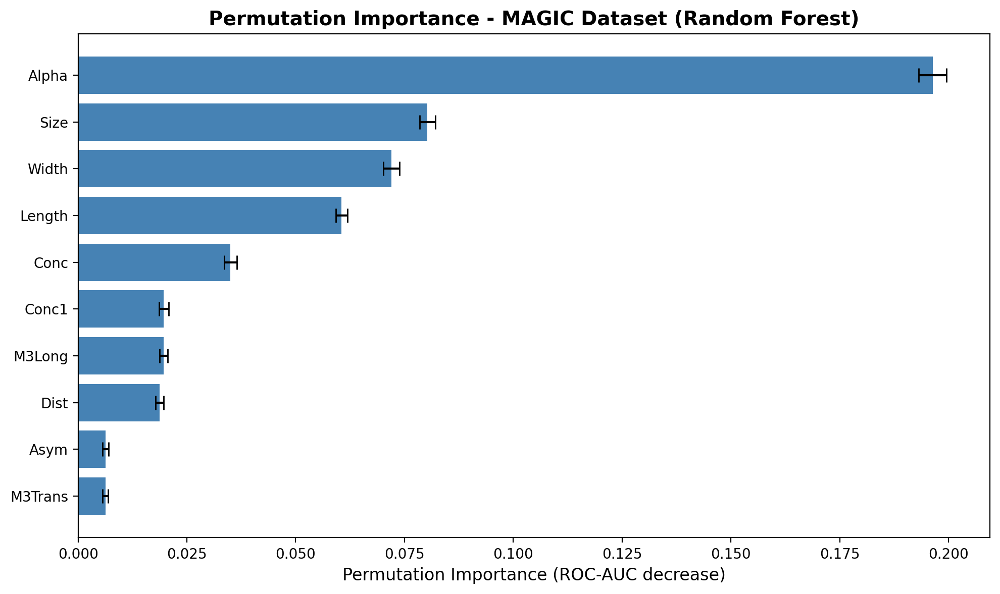

Permutation Importance для датасета MAGIC:
   Feature  Importance       Std
8    Alpha    0.196374  0.003184
2     Size    0.080293  0.001763
1    Width    0.071948  0.001860
0   Length    0.060544  0.001366
3     Conc    0.035014  0.001470
4    Conc1    0.019695  0.001074
6   M3Long    0.019691  0.000925
9     Dist    0.018705  0.000951
5     Asym    0.006353  0.000713
7  M3Trans    0.006310  0.000634


In [45]:
rf_magic_perm = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_perm.fit(X_train, y_train)

importance_df_magic = plot_permutation_importance(
    rf_magic_perm, X_test, y_test, columns,
    n_repeats=10, random_state=42, scoring='roc_auc', n_jobs=-1,
    title='Permutation Importance - MAGIC Dataset (Random Forest)',
    xlabel='Permutation Importance (ROC-AUC decrease)',
    color='steelblue'
)

print("Permutation Importance для датасета MAGIC:")
print(importance_df_magic)


Сравним Permutation Importance с встроенной важностью Random Forest для датасета MAGIC:


Сравнение методов для датасета MAGIC:
   Feature  Permutation Importance  Built-in Importance
8   Length                0.196374             0.156662
2    Width                0.080293             0.116670
1     Size                0.071948             0.110422
0     Conc                0.060544             0.061434
3    Conc1                0.035014             0.055834
4     Asym                0.019695             0.050972
6   M3Long                0.019691             0.088849
9  M3Trans                0.018705             0.051719
5    Alpha                0.006353             0.236464
7     Dist                0.006310             0.070973


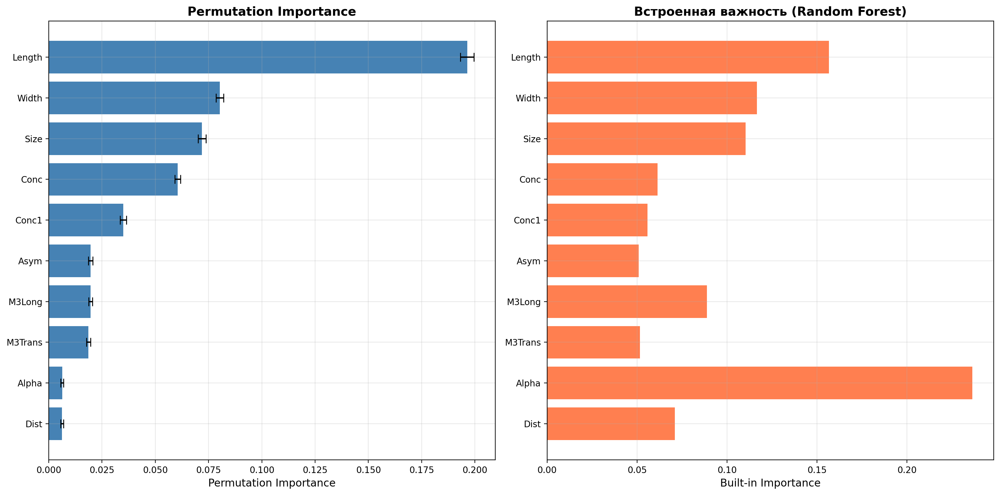

In [46]:
builtin_importance_magic = rf_magic_perm.feature_importances_

comparison_magic_df = pd.DataFrame({
    'Feature': columns,
    'Permutation Importance': importance_df_magic["Importance"],
    'Built-in Importance': builtin_importance_magic
}).sort_values('Permutation Importance', ascending=False)

print("Сравнение методов для датасета MAGIC:")
print(comparison_magic_df)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

sort_idx = comparison_magic_df.index
y_pos = np.arange(len(comparison_magic_df))

ax1.barh(y_pos, comparison_magic_df['Permutation Importance'], 
         xerr=importance_df_magic.loc[sort_idx, "Std"], capsize=5, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(comparison_magic_df['Feature'])
ax1.set_xlabel('Permutation Importance', fontsize=12)
ax1.set_title('Permutation Importance', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(True, alpha=0.3)

ax2.barh(y_pos, comparison_magic_df['Built-in Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(comparison_magic_df['Feature'])
ax2.set_xlabel('Built-in Importance', fontsize=12)
ax2.set_title('Встроенная важность (Random Forest)', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Также применим Permutation Importance к линейной модели для сравнения:


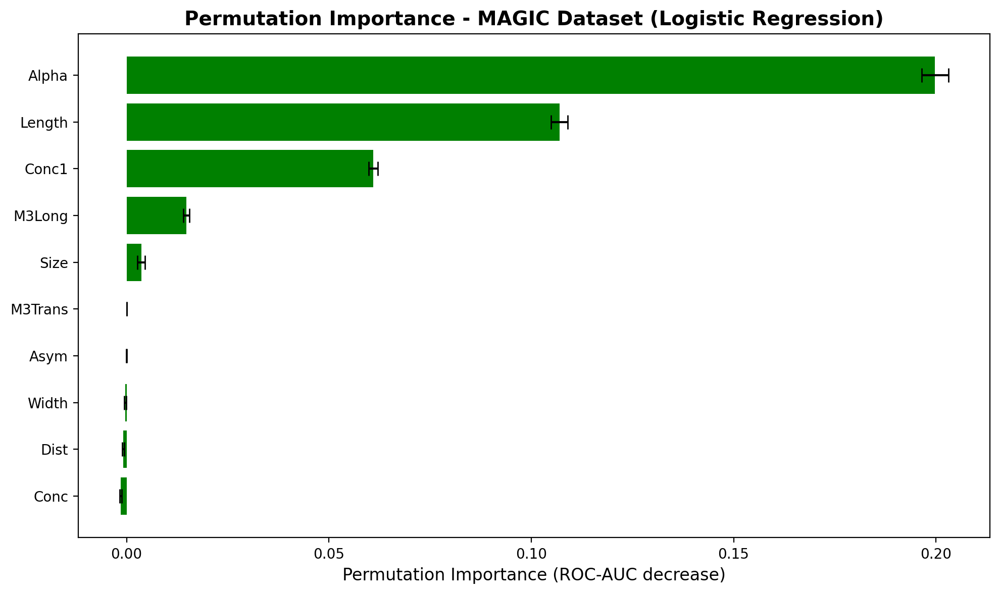

Permutation Importance для Logistic Regression (MAGIC):
   Feature    Importance       Std
8    Alpha  1.997752e-01  0.003329
0   Length  1.069617e-01  0.002063
4    Conc1  6.093163e-02  0.001144
6   M3Long  1.477874e-02  0.000797
2     Size  3.607717e-03  0.000990
7  M3Trans  3.731491e-05  0.000054
5     Asym -3.249414e-07  0.000037
1    Width -3.265661e-04  0.000249
9     Dist -8.140606e-04  0.000236
3     Conc -1.491379e-03  0.000256


In [47]:
scaler_magic_perm = StandardScaler()
X_train_magic_scaled_perm = scaler_magic_perm.fit_transform(X_train)
X_test_magic_scaled_perm = scaler_magic_perm.transform(X_test)

lr_magic_perm = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_perm.fit(X_train_magic_scaled_perm, y_train)

importance_df_magic_lr = plot_permutation_importance(
    lr_magic_perm, X_test_magic_scaled_perm, y_test, columns,
    n_repeats=10, random_state=42, scoring='roc_auc', n_jobs=-1,
    title='Permutation Importance - MAGIC Dataset (Logistic Regression)',
    xlabel='Permutation Importance (ROC-AUC decrease)',
    color='green'
)

print("Permutation Importance для Logistic Regression (MAGIC):")
print(importance_df_magic_lr)


Одним из важных ограничений Permutation Importance является его поведение при наличии коррелированных признаков. Если два признака сильно коррелированы, то при перемешивании одного из них модель может использовать информацию из коррелированного признака, что приведет к занижению важности обоих признаков.При наличии сильно коррелированных признаков важно интерпретировать результаты с осторожностью. Можно рассмотреть группировку коррелированных признаков или использование других методов интерпретации.

Кроме того, Permutation Importance зависит от выбранной метрики качества. Выбор метрики должен соответствовать бизнес-задаче. Например, если важна точность предсказания определенного класса, следует использовать соответствующую метрику.

Иногда Permutation Importance может быть отрицательной. Это означает, что перемешивание признака **улучшило** качество модели. Возможные причины:

1. **Переобучение**: Модель переобучилась на шум в этом признаке
2. **Случайность**: При малом количестве повторений возможны случайные флуктуации
3. **Корреляция**: При наличии коррелированных признаков перемешивание одного может случайно улучшить предсказания


### Мультиколлинеарность

При наличии сильно коррелированных признаков permutation importance может недооценивать важность признаков. Если два признака сильно коррелированы, при перемешивании одного из них модель может использовать информацию из коррелированного признака, что приводит к занижению важности обоих.

Для корректной оценки важности признаков при мультиколлинеарности можно использовать кластеризацию признаков по корреляции и оценивать важность кластеров признаков, а не отдельных признаков.

Рассмотрим эту ситуацию на примере wbcd.

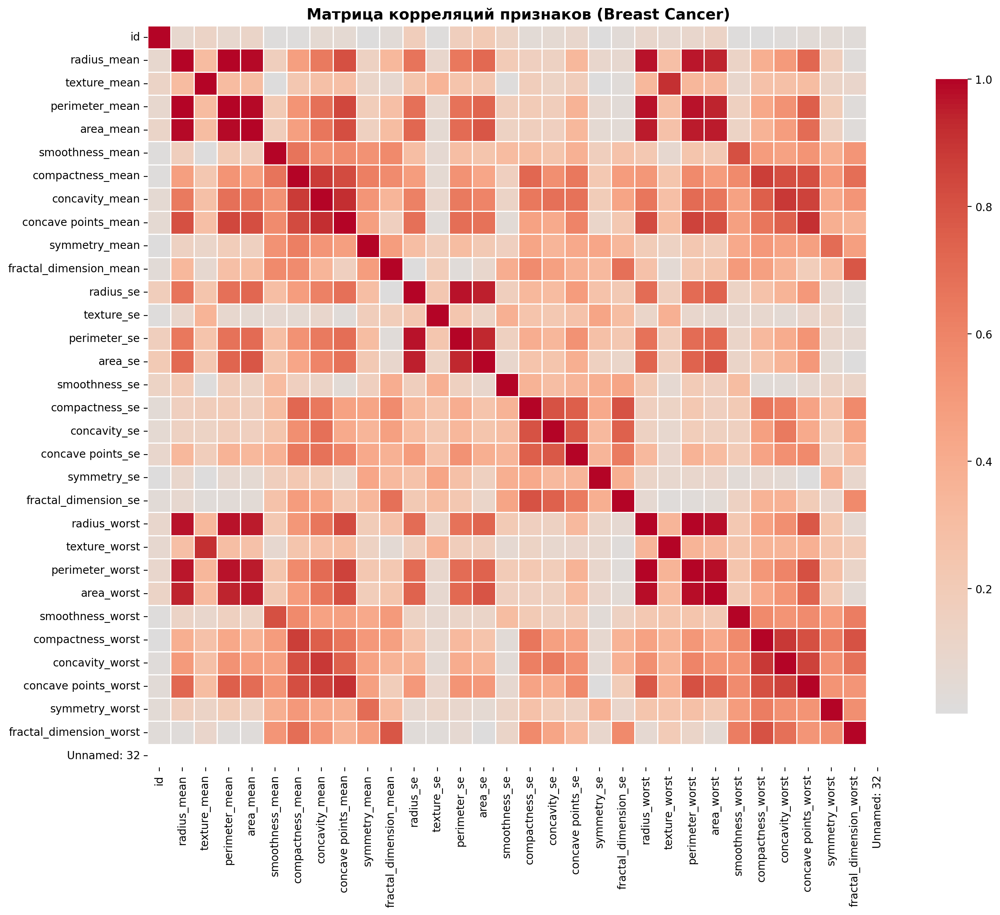

In [48]:
import seaborn as sns

data_bc =  pd.read_csv(pjoin(data_path, "wdbc", "data.csv"))
X_bc = data_bc.drop("diagnosis", axis=1)
y_bc = data_bc["diagnosis"]

X_train_bc, X_test_bc, y_train_bc, y_test_bc = train_test_split(
    X_bc, y_bc, test_size=0.2, random_state=42
)

corr_matrix = X_train_bc.corr().abs()

plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, square=True, 
            linewidths=0.5, cbar_kws={"shrink": 0.8}, fmt='.2f')
plt.title('Матрица корреляций признаков (Breast Cancer)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


In [49]:
rf_bc = RandomForestClassifier(n_estimators=100, random_state=42)
rf_bc.fit(X_train_bc, y_train_bc)
print(
    "Accuracy on test data with all feature: {:.2f}".format(
        rf_bc.score(X_test_bc, y_test_bc)
    )
)

Accuracy on test data with all feature: 0.96


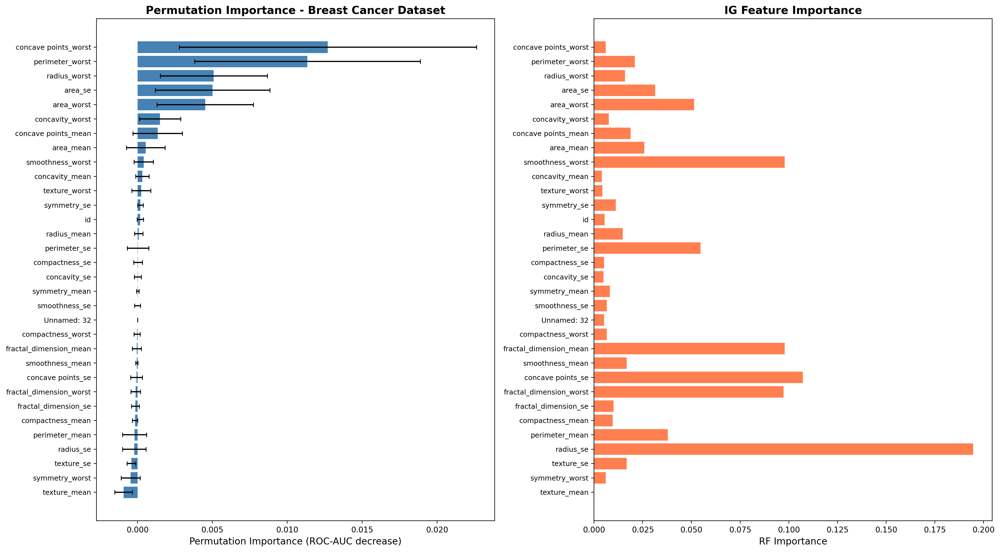

In [50]:
importance_df_bc = plot_permutation_importance(
    rf_bc, X_test_bc, y_test_bc, X_bc.columns,
    n_repeats=10, random_state=42, scoring='roc_auc',
    show_plot=False
)

rf_importance = rf_bc.feature_importances_
importance_df_bc['RF Importance'] = rf_importance

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

y_pos = np.arange(len(importance_df_bc))
ax1.barh(y_pos, importance_df_bc['Importance'], 
        xerr=importance_df_bc['Std'], capsize=3, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax1.set_xlabel('Permutation Importance (ROC-AUC decrease)', fontsize=12)
ax1.set_title('Permutation Importance - Breast Cancer Dataset', fontsize=14, fontweight='bold')
ax1.invert_yaxis()

ax2.barh(y_pos, importance_df_bc['RF Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax2.set_xlabel('RF Importance', fontsize=12)
ax2.set_title('IG Feature Importance', fontsize=14, fontweight='bold')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()

Один из способов обработки мультиколлинеарных признаков — выполнение иерархической кластеризации на основе корреляций, выбор порога и сохранение одного признака из каждого кластера.

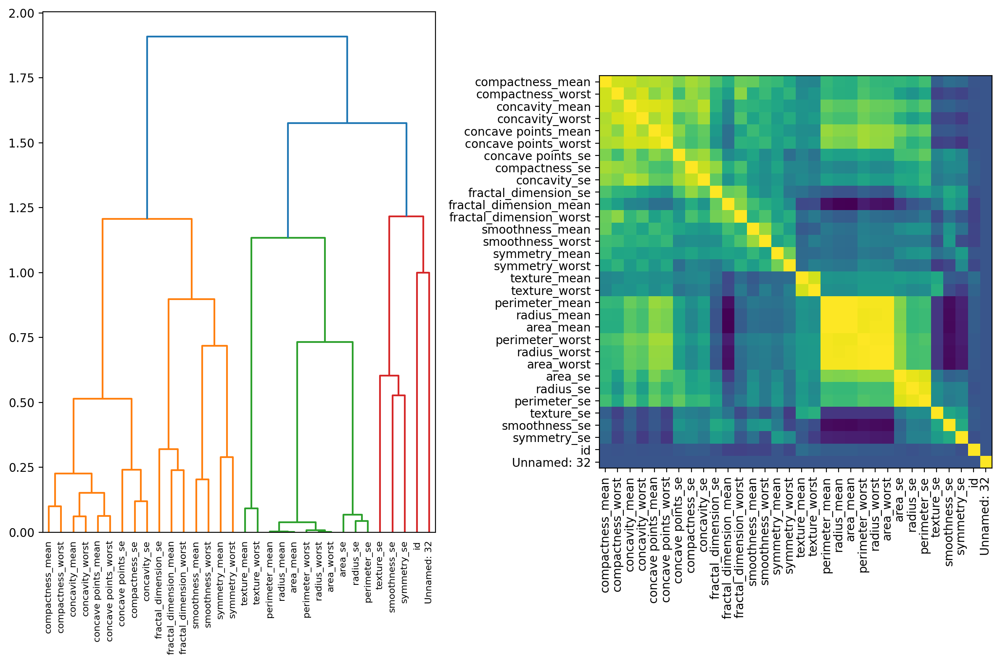

In [51]:
from scipy.stats import spearmanr
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
corr = np.nan_to_num(spearmanr(X_bc).correlation) # don't need target
# Ensure the correlation matrix is symmetric - it's important to use it as distance
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)
distance_matrix = 1 - np.abs(corr)

# We perform Ward clustering, because it builds dense and similar-size clusters.
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=X_bc.columns.tolist(), ax=ax1, leaf_rotation=90
)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
fig.tight_layout()
plt.show()

Задание: постройте карту корреляций с дендрограммой силами sklearn. Насколько отличаются дендрограммы? По возможности объясните разницу (или укажите, что там используется тот же алгоритм)

Далее мы можем выбрать необходимый нам уровень кластеров, чтобы выбрать признак для оценки. 

In [52]:
from collections import defaultdict


cluster_ids = hierarchy.fcluster(dist_linkage, 1, criterion="distance")
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)
selected_features = [X_train_bc.columns[v[1]] for v in cluster_id_to_feature_ids.values()]
print(f"Selected features: {selected_features}")

X_train_sel = X_train_bc[selected_features]
X_test_sel = X_test_bc[selected_features]

rf_sel = RandomForestClassifier(n_estimators=100, random_state=42)
rf_sel.fit(X_train_sel, y_train_bc)
print(
    "Accuracy on test data with features removed: {:.2f}".format(
        rf_sel.score(X_test_sel, y_test_bc)
    )
)

Selected features: ['Unnamed: 32', 'perimeter_mean', 'texture_worst', 'symmetry_mean', 'concavity_mean', 'smoothness_se']
Accuracy on test data with features removed: 0.96


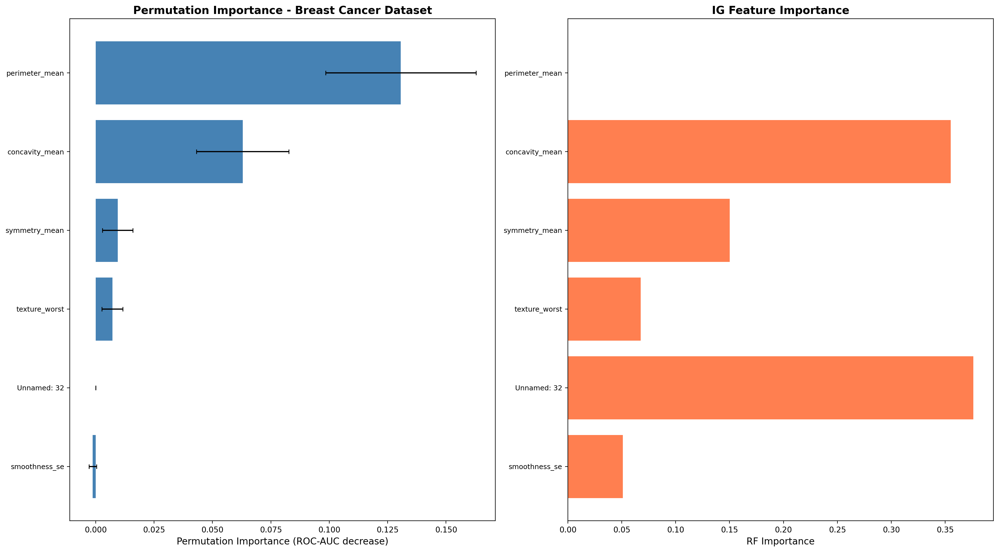

In [53]:

importance_df_bc = plot_permutation_importance(
    rf_sel, X_test_sel, y_test_bc, selected_features,
    n_repeats=10, random_state=42, scoring='roc_auc',
    show_plot=False
)

rf_importance = rf_sel.feature_importances_
importance_df_bc['RF Importance'] = rf_importance

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

y_pos = np.arange(len(importance_df_bc))
ax1.barh(y_pos, importance_df_bc['Importance'], 
        xerr=importance_df_bc['Std'], capsize=3, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax1.set_xlabel('Permutation Importance (ROC-AUC decrease)', fontsize=12)
ax1.set_title('Permutation Importance - Breast Cancer Dataset', fontsize=14, fontweight='bold')
ax1.invert_yaxis()

ax2.barh(y_pos, importance_df_bc['RF Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax2.set_xlabel('RF Importance', fontsize=12)
ax2.set_title('IG Feature Importance', fontsize=14, fontweight='bold')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()

Задание: Покажите влияние мультиколлинеарности на F-statistic, проверив признаки WDBC в разном порядке. Как меняется важность при смене порядка?

In [55]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import f_classif

def compute_f_ranking(X, y, feature_names, seed=None):
    if seed is not None:
        rng = np.random.default_rng(seed)
        idx = rng.permutation(len(feature_names))
        X = X[:, idx]
        feature_names = [feature_names[i] for i in idx]

    f_vals, p_vals = f_classif(X, y)

    return pd.Series(f_vals, index=feature_names).sort_values(ascending=False)


f_base = compute_f_ranking(X_train, y_train, columns)

f_perm1 = compute_f_ranking(X_train, y_train, columns, seed=1)
f_perm2 = compute_f_ranking(X_train, y_train, columns, seed=42)

print("base order")
print(f_base.round(3))

print("\npermutation 1")
print(f_perm1.round(3))

print("\npermutation 2")
print(f_perm2.round(3))

base order
Alpha      2642.334
Length      988.376
Width       697.796
M3Long      366.943
Asym        286.068
Size        136.179
Dist         41.611
Conc          4.275
M3Trans       0.362
Conc1         0.004
dtype: float64

permutation 1
Alpha      2642.334
Length      988.376
Width       697.796
M3Long      366.943
Asym        286.068
Size        136.179
Dist         41.611
Conc          4.275
M3Trans       0.362
Conc1         0.004
dtype: float64

permutation 2
Alpha      2642.334
Length      988.376
Width       697.796
M3Long      366.943
Asym        286.068
Size        136.179
Dist         41.611
Conc          4.275
M3Trans       0.362
Conc1         0.004
dtype: float64


Странно, но при перестановке признаков значения F-statistic вообще не изменились. Это, вероятно, происходит потому, что F-test считается отдельно для каждого признака и не зависит от их порядка или других признаков в датасете. По-видимому из-за этого он не реагирует на мультиколлинеарность через порядок, хотя сама проблема остаётся — коррелирующие признаки могут “делить” между собой важность и искажать интерпретацию результатов.

## Feature selection
Как же перейти от простой оценки важности признаков к поиску такого подмножества, которое приведет к наибольшей точности модели?
Можно использовать рекурсиввный выбор признаков (Recursive feature selection, или RFE).
RFE работает путем поиска подмножества признаков, начиная со всех признаков в наборе и постепенно удаляя самые незначимые, пока не останется желаемое количество.

Это достигается путем подбора модели для оценки, ранжирования признаков по важности, отбрасывания наименее важного признака и повторного обучения модели. Этот процесс повторяется до тех пор, пока не останется заданное количество признаков. Характеристики оцениваются либо с использованием предоставленной модели, либо с использованием статистического метода, такого как f-score или IG.

В sklearn реализован класс трансформера для такого подбора, при этом подюор может быть отделен от основной модели. 

In [56]:
# scaler = StandardScaler()
rfe = RFE(estimator=RandomForestRegressor(), n_features_to_select=5)
model = LogisticRegression()
#pipeline = Pipeline(steps=[('sc',scaler),('s',rfe),('m',model)])
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
print_feature_names(rfe.get_feature_names_out(), columns)
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
acc = accuracy_score(y_test, y_hat)
print('Accuracy: %.3f' % acc)

Selected features: ['Length', 'Width', 'Size', 'M3Long', 'Alpha']
Accuracy: 0.789


**Задание**: Реализуйте данный метод вручную. Бонусное задание: реализуйте класс трансформера для подбора и/или конфигурируемые метрику и модель.

In [58]:
import numpy as np
from sklearn.metrics import accuracy_score

def find_best_features_set(X_train, y_train, X_test, y_test, model, columns):

    X_train_curr = X_train.copy()
    X_test_curr = X_test.copy()
    f_names_curr = np.array(columns)

    scores = []

    for i in range(X_train.shape[1]):

        model.fit(X_train_curr, y_train)

        if hasattr(model, "feature_importances_"):
            importances = model.feature_importances_
        else:
            importances = np.abs(model.coef_[0])

        y_hat = model.predict(X_test_curr)
        score = accuracy_score(y_test, y_hat)

        print("score:", round(score, 4))
        scores.append(score)

        min_idx = np.argmin(importances)

        X_train_curr = np.delete(X_train_curr, min_idx, axis=1)
        X_test_curr = np.delete(X_test_curr, min_idx, axis=1)
        f_names_curr = np.delete(f_names_curr, min_idx)

    return scores, f_names_curr

In [59]:
from sklearn.base import BaseEstimator, TransformerMixin

class RFESelector(BaseEstimator, TransformerMixin):

    def __init__(self, model, n_features=None, metric=accuracy_score):
        self.model = model
        self.n_features = n_features
        self.metric = metric

    def fit(self, X, y):
        self.X_ = X.copy()
        self.y_ = y.copy()
        self.selected_idx_ = np.arange(X.shape[1])

        X_curr = X.copy()

        while X_curr.shape[1] > (self.n_features or 1):

            self.model.fit(X_curr, y)

            if hasattr(self.model, "feature_importances_"):
                imp = self.model.feature_importances_
            else:
                imp = np.abs(self.model.coef_[0])

            remove_idx = np.argmin(imp)

            X_curr = np.delete(X_curr, remove_idx, axis=1)
            self.selected_idx_ = np.delete(self.selected_idx_, remove_idx)

        return self

    def transform(self, X):
        return X[:, self.selected_idx_]

score: 0.7911
score: 0.7915
score: 0.791
score: 0.7915
score: 0.7916
score: 0.7891
score: 0.7547
score: 0.6464
score: 0.6454
score: 0.6484


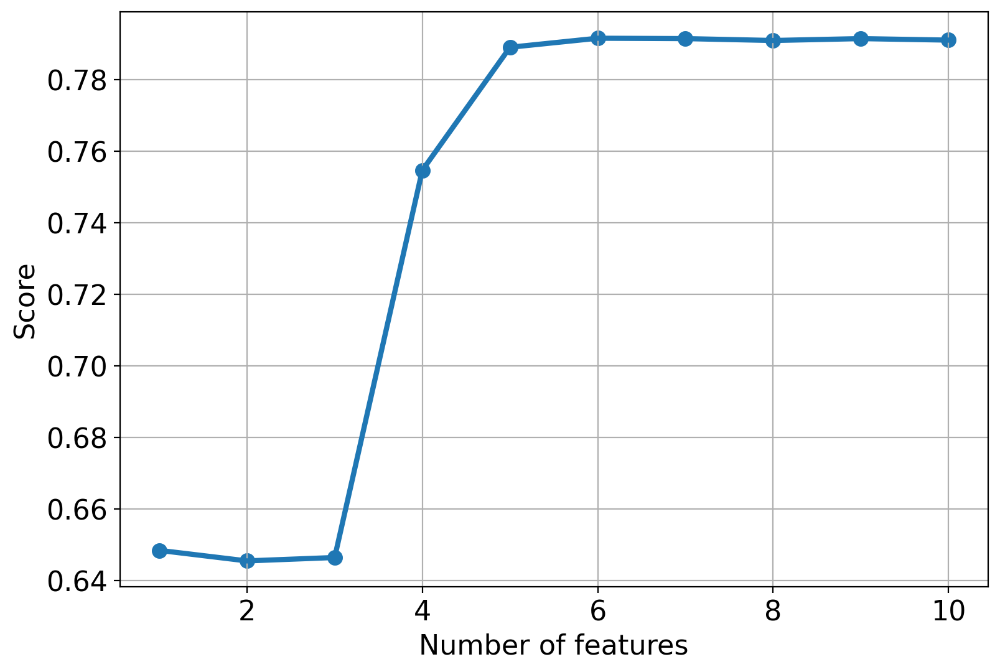

In [60]:
scores, f_names  = find_best_features_set(X_train, y_train, X_test, y_test, model, columns)
nf = np.arange(1, len(scores)+1)[::-1]
plt.figure(figsize=(9, 6))

plt.plot(nf, scores, linewidth=3)
plt.scatter(nf, scores, linewidth=3)

plt.xlabel("Number of features", size=16)
plt.ylabel("Score", size=16)
plt.xticks(size=16)
plt.yticks(size=16)
plt.grid()
plt.show()

### PCA

[Ноутбук Евгения Соколова](https://github.com/esokolov/ml-course-hse/blob/master/2022-spring/seminars/sem14_pca_tsne.ipynb)

Выделение новых признаков путем их отбора часто дает плохие результаты, и в некоторых ситуациях такой подход практически бесполезен. Например, если мы работаем с изображениями, у которых признаками являются яркости пикселей,
невозможно выбрать небольшой поднабор пикселей, который дает хорошую информацию о содержимом картинки. Поэтому признаки нужно как-то комбинировать.\n",

__Метод главных компонент__ &mdash; один из самых интуитивно простых и часто используемых методов для снижения размерности данных и проекции их на ортогональное подпространство признаков. В рамках метода делается два важных упрощения задачи:
1. игнорируется целевая переменная;
2. строится линейная комбинация признаков.
П. 1 на первый взгляд кажется довольно странным, но на практике обычно не является таким уж плохим. Это связано с тем, что часто данные устроены так, что имеют какую-то внутреннюю структуру в пространстве меньшей размерности, которая никак не связана с целевой переменной. Поэтому и оптимальные признаки можно строить не глядя на ответ.
П. 2 тоже сильно упрощает задачу, но далее мы научимся избавляться от него.

PCA ищет линейную комбинацию переменных, чтобы мы могли извлечь максимальную дисперсию из них. По завершении этого процесса он удаляет ее и ищет другую линейную комбинацию (фактор), которая дает объяснение максимальной пропорции оставшейся дисперсии, что приводит к ортогональным факторам. Это повторяется столько раз, чтобы достигнуть целевого числа объясненной дисперсии или числа факторов.

### Теория
Кратко вспомним, что делает этот метод.
Пусть $X$ &mdash; матрица объекты-признаки, с нулевым средним каждого признака, а $w$ &mdash; некоторый единичный вектор. Тогда $Xw$ задает величину проекций всех объектов на этот вектор. Далее ищется вектор, который дает наибольшую дисперсию полученных проекций (то есть наибольшую дисперсию вдоль этого направления):
$$\max_{w: \|w\|=1} \| Xw \|^2 =  \max_{w: \|w\|=1} w^T X^T X w$$
Подходящий вектор тогда равен собственному вектору матрицы $X^T X$ с наибольшим собственным значением. После этого все пространство проецируется на ортогональное дополнение к вектору $w$ и процесс повторяется.
   

In [61]:
np.random.seed(314512)

data_synth_1 = np.random.multivariate_normal(
    mean=[0, 0],
    cov=[[4, 0],
         [0, 1]],
    size=1000
)

Теперь изобразим точки выборки на плоскости и применим к ним PCA для нахождения главных компонент. В результате работы PCA из sklearn в dec.components_ будут лежать главные направления (нормированные), а в dec.explained_variance_ — дисперсия, которую объясняет каждая компонента. Изобразим на нашем графике эти направления, умножив их на дисперсию для наглядного отображения их значимости.

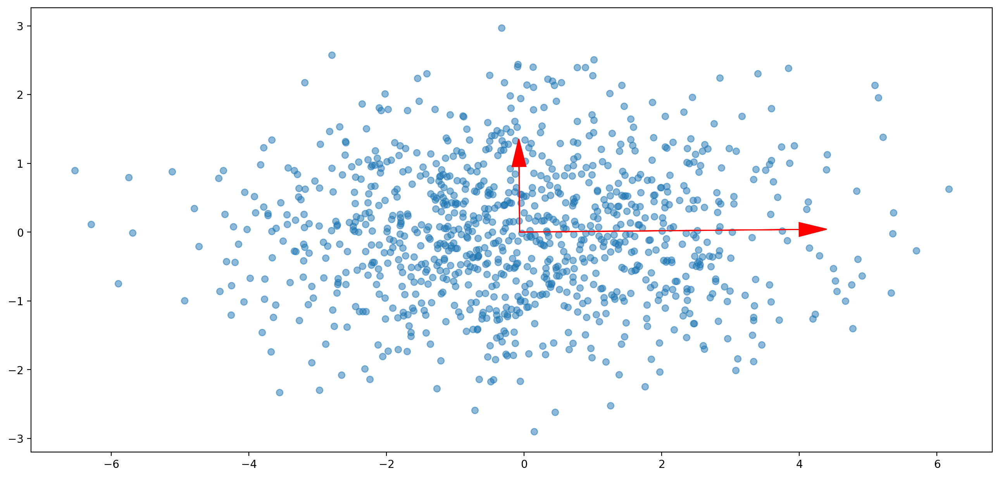

In [62]:
from sklearn.decomposition import PCA

def PCA_show(dataset):
    plt.scatter(*zip(*dataset), alpha=0.5)

    dec = PCA()
    dec.fit(dataset)
    ax = plt.gca()
    for comp_ind in range(dec.components_.shape[0]):
        component = dec.components_[comp_ind, :]
        var = dec.explained_variance_[comp_ind]
        start, end = dec.mean_, component * var
        ax.arrow(start[0], start[1], end[0], end[1],
                 head_width=0.2, head_length=0.4, fc='r', ec='r')

    ax.set_aspect('equal', adjustable='box')

plt.figure(figsize=(16, 8))
PCA_show(data_synth_1)

Видим, что PCA все правильно нашел. Но это, конечно, можно было сделать и просто посчитав дисперсию каждого признака. Повернем наши данные на некоторый фиксированный угол и проверим, что для PCA это ничего не изменит.

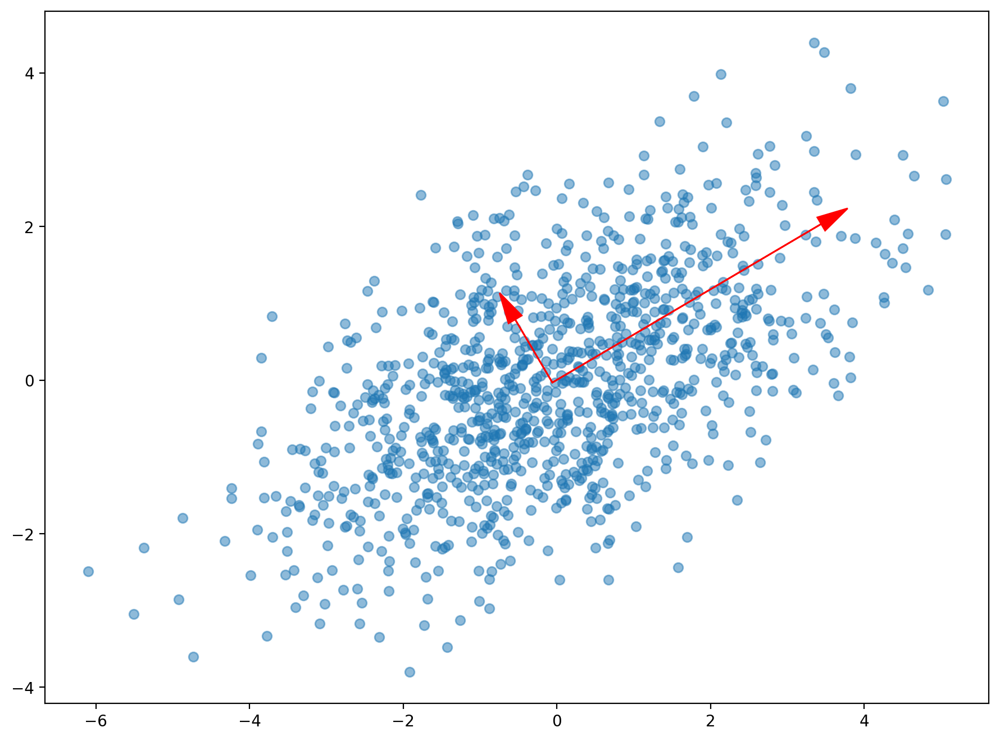

In [64]:
angle = np.pi / 6
rotate = np.array([
        [np.cos(angle), - np.sin(angle)],
        [np.sin(angle), np.cos(angle)],
    ])
data_synth_2 = rotate.dot(data_synth_1.T).T

plt.figure(figsize=(16, 8))
PCA_show(data_synth_2)

Ниже пара примеров, где PCA отработал не так хорошо (в том смысле, что направления задают не очень хорошие признаки).

Вопрос: почему так произошло?

Ответ: PCA работает плохо, потому что он ищет направления максимальной дисперсии и предполагает линейную структуру данных. В нелинейных или кластерных случаях такая структура не отражает реальную геометрию данных, поэтому компоненты оказываются неинформативными.

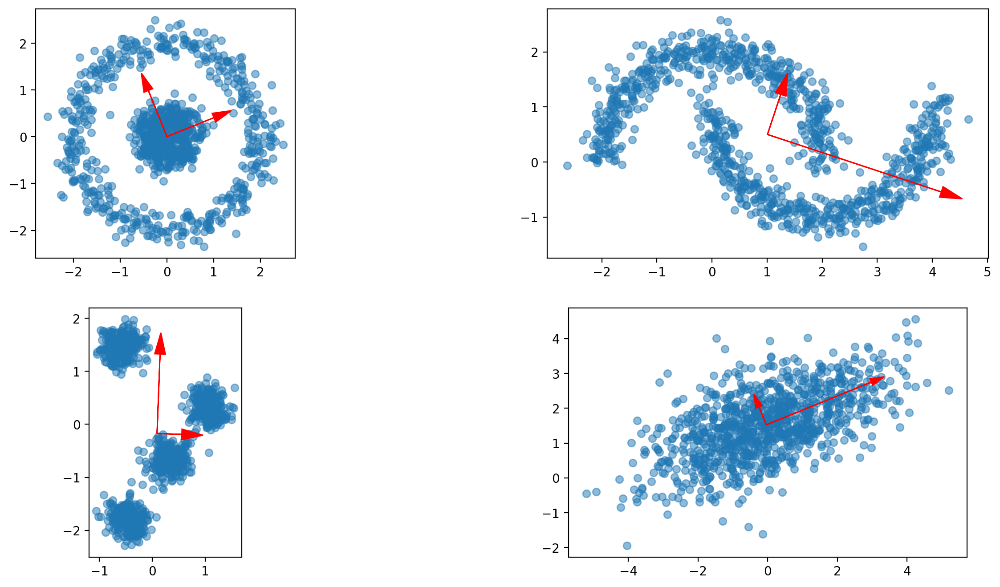

In [65]:
from sklearn.datasets import make_circles, make_moons, make_blobs

np.random.seed(54242)

data_synth_bad = [
    make_circles(n_samples=1000, factor=0.2, noise=0.1)[0]*2,
    make_moons(n_samples=1000, noise=0.1)[0]*2,
    make_blobs(n_samples=1000, n_features=2, centers=4)[0]/5,
    np.random.multivariate_normal(
        mean=[0, 1.5],
        cov=[[3, 1],
             [1, 1]],
        size=1000),
]

plt.figure(figsize=(16,8))
rows, cols = 2, 2
for i, data in enumerate(data_synth_bad):
    plt.subplot(rows, cols, i + 1)
    PCA_show(data)

In [66]:
scaler = StandardScaler()


Доп.задание : Запустите предыдущий метод с учетом скейлинга. Поменяется ли результат?

In [67]:
pca = PCA(n_components = 5)
pipeline = Pipeline(steps=[('sc', scaler), ('pca',pca),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
pcas = " ".join(f"{i:.2}" for i in pca.explained_variance_ratio_)
print(f"Explained {pcas} ({pca.explained_variance_ratio_.sum():.2f}) ratio of variance")
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, y_hat)
print('MAE: %.3f' % mae)

Explained 0.42 0.16 0.1 0.1 0.073 (0.85) ratio of variance
MAE: 0.220


Почему важно использование скейлинга перед проведением PCA?
Если один объект варьируется больше, чем другие, только из-за их соответствующих масштабов, PCA определит, что такой объект доминирует в направлении главных компонентов.

Ответ: Скейлинг важен перед PCA, потому что PCA основан на дисперсии признаков и чувствителен к их масштабу. Если один признак имеет большие значения просто из-за единиц измерения, а не из-за реальной важности, он будет доминировать при построении главных компонент и поломает результат. Скейлинг приводит все признаки к одному масштабу, чтобы PCA оценивал их вклад более правильно.

In [68]:
pca = PCA(n_components = 5)
pipeline = Pipeline(steps=[('pca',pca),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
pcas = " ".join(f"{i:.2}" for i in pca.explained_variance_ratio_)
print(f"Explained {pcas} ({pca.explained_variance_ratio_.sum():.2f}) ratio of variance")
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, y_hat)
print('MAE: %.3f' % mae)

Explained 0.44 0.26 0.13 0.09 0.04 (0.96) ratio of variance
MAE: 0.211


 Какой метод наиболее страдает от проклятия размерности?
 KNN.

 Покажем это.

Рассмотрим набор MNIST - набор рукописных чисел от 0 до 9. Это один из классических наборов для компьютернорго зроения, состоящий из 100 тысяч черно-белых изображений 28х28. Однако матрицы можно и вытянуть в вектор, чтобы предсказывать класс в табличном формате. Тогда мы получим пространство признаков размера 784!

In [69]:
mnist = fetch_openml('mnist_784', cache=False)

X = mnist["data"].astype('float64')
X.reset_index()
y = mnist["target"].astype('int64')
y.reset_index()

print("\nNo. of Samples: ", X.shape)
print("No. of Labels: ", y.shape)


No. of Samples:  (70000, 784)
No. of Labels:  (70000,)


Так выглядит набор данных в табличном виде

In [70]:
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Рассмотрим случайный семпл в данных (преобразовав обратно в матрицу)

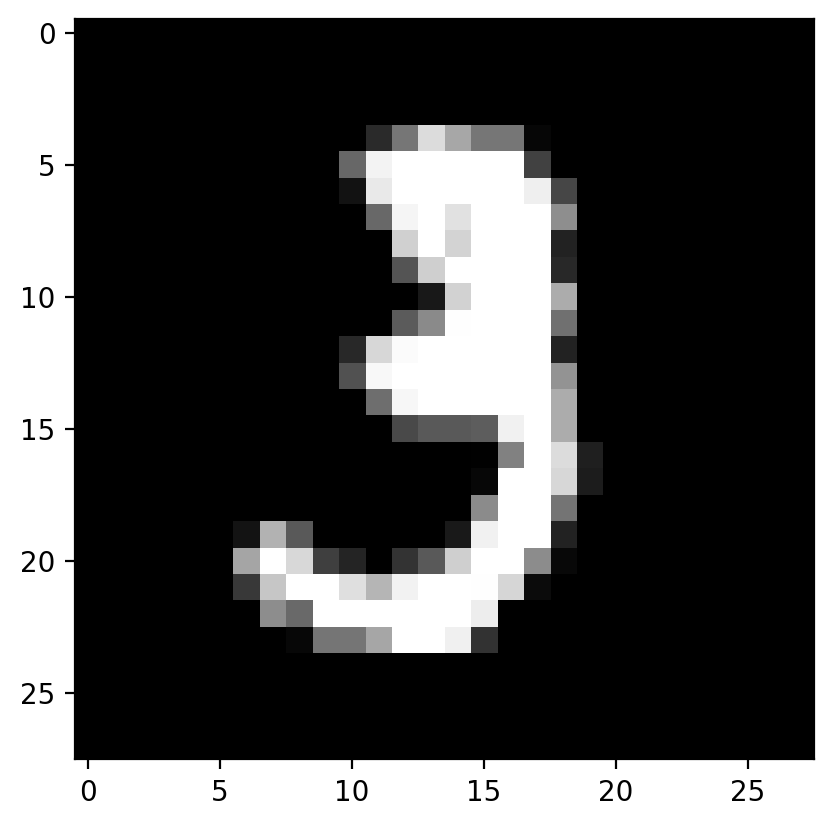

In [71]:
random_digit = X.loc[10,:].values

random_digit_image = random_digit.reshape(28, 28)

plt.imshow(random_digit_image, cmap = 'gray', interpolation="nearest")
#plt.axis("off")
plt.show()


Отнормируем

In [72]:
X /= 255.0


In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Заодно с обучением модели вспомним о поиске гиперпараметров. Что это такое?

```bash
param_grid = {'n_neighbors': [3, 4, 5, 9], 'p': [1, 2, 1000], 'weights': ["uniform", "distance"]}

knn_clf = KNeighborsClassifier()

knn_cv = GridSearchCV(knn_clf, param_grid, scoring='f1_micro', cv=5, verbose=1, n_jobs=-1)
knn_cv.fit(X_train, y_train)


params_optimal_knn = knn_cv.best_params_

print("Best Score: %f" % knn_cv.best_score_)
print("Optimal Hyperparameter Values: ", params_optimal_knn)
print("\n")
```

Так как данных очень много, сделаем равномерно засемплим 1000 точек. В общем случае это плохая практика. Почему?

In [77]:
random_indices = np.random.choice(X.index, 10000, replace=False)
X_rus = X.loc[random_indices]
y_rus = y.loc[random_indices]

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus, test_size=0.2, random_state=0)
print(X_train.shape, y_test.shape)

(8000, 784) (2000,)


In [79]:
param_grid = {'n_neighbors': [3, 4], 'p': [2], 'weights': ["distance"]}


knn_clf = KNeighborsClassifier()

knn_cv = GridSearchCV(knn_clf, param_grid, scoring='f1_micro', cv=5, verbose=1, n_jobs=-1)
knn_cv.fit(X_train, y_train)


params_optimal_knn = knn_cv.best_params_

print("Best Score: %f" % knn_cv.best_score_)
print("Optimal Hyperparameter Values: ", params_optimal_knn)
print("\n")

Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best Score: 0.941250
Optimal Hyperparameter Values:  {'n_neighbors': 4, 'p': 2, 'weights': 'distance'}




In [80]:
%%time
knn = KNeighborsClassifier(**params_optimal_knn)

knn.fit(X_train, y_train)

y_train_predicted = knn.predict(X_train)

train_accuracy_knn = np.mean(y_train_predicted == y_train)
print("\nTraining Accuracy: ", train_accuracy_knn)


Training Accuracy:  1.0
CPU times: total: 10.9 s
Wall time: 2.15 s


In [81]:
%%time

y_train_pred = cross_val_predict(knn, X_train, y_train, cv=5)
confusion_matrix(y_train, y_train_pred)

CPU times: total: 14.4 s
Wall time: 1.35 s


array([[786,   1,   1,   1,   0,   3,   5,   1,   0,   1],
       [  0, 889,   3,   2,   2,   0,   2,   0,   0,   0],
       [ 12,  16, 723,  10,   3,   0,   5,  15,   4,   2],
       [  0,   8,   7, 789,   0,  20,   2,   9,   7,   5],
       [  0,   9,   0,   0, 701,   0,   5,   5,   0,  33],
       [  5,   5,   0,  11,   1, 707,  16,   0,   5,  10],
       [  5,   6,   3,   0,   3,   7, 737,   0,   1,   0],
       [  1,  16,   0,   1,   5,   1,   0, 766,   0,  24],
       [  2,  15,   4,  21,   5,  24,   3,   6, 665,  15],
       [  5,   5,   0,   7,  13,   4,   0,  12,   4, 767]])

In [82]:

y_test_predicted = knn.predict(X_test)

test_accuracy_knn = np.mean(y_test_predicted == y_test)
print("\nTraining Accuracy: ", test_accuracy_knn)


Training Accuracy:  0.949


In [83]:
%%time

# The accuracy of the model
test_accuracy_knn = knn.score(X_test, y_test)
print("\nTest Accuracy: ", test_accuracy_knn)


# No. of Correct Predictions
y_test_predicted = knn.predict(X_test)
print("\nNo. of correct predictions (Test): %d/%d" % (np.sum(y_test_predicted == y_test), len(y_test)))


# Confusion Matrix
print("\nConfusion Matrix (Test Data):\n", confusion_matrix(y_test, y_test_predicted))


Test Accuracy:  0.949

No. of correct predictions (Test): 1898/2000

Confusion Matrix (Test Data):
 [[176   0   0   0   0   0   0   0   0   0]
 [  0 217   0   0   1   0   0   1   0   0]
 [  1   5 181   3   2   0   1   5   0   0]
 [  0   0   1 205   0   3   0   2   1   1]
 [  0   0   0   0 194   0   0   0   0   8]
 [  2   4   0   5   0 169   2   0   0   3]
 [  1   0   0   0   0   0 222   0   0   0]
 [  0   3   1   1   0   0   0 199   0   5]
 [  0   5   2   6   1  11   0   2 158   3]
 [  1   1   0   2   3   1   0   2   0 177]]
CPU times: total: 5.88 s
Wall time: 495 ms


In [84]:
pd.crosstab(y_test, y_test_predicted, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,2,3,4,5,6,7,8,9,All
True,,,,,,,,,,,
0,176,0,0,0,0,0,0,0,0,0,176
1,0,217,0,0,1,0,0,1,0,0,219
2,1,5,181,3,2,0,1,5,0,0,198
3,0,0,1,205,0,3,0,2,1,1,213
4,0,0,0,0,194,0,0,0,0,8,202
5,2,4,0,5,0,169,2,0,0,3,185
6,1,0,0,0,0,0,222,0,0,0,223
7,0,3,1,1,0,0,0,199,0,5,209
8,0,5,2,6,1,11,0,2,158,3,188


Попробуем уменьшить влияние проклятия размерности с помощью уменьшения размерности, использовав метод PCA.

In [85]:
%%time
pca = PCA(n_components=0.95)
pca.fit(X_train)

print("Number of Principle Components: ", pca.n_components_)

Number of Principle Components:  150
CPU times: total: 3.7 s
Wall time: 724 ms


In [86]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [87]:
%%time


knn_pca = KNeighborsClassifier(n_neighbors=4, p=2, weights="distance")

knn_pca.fit(X_train_pca, y_train)


y_test_predicted_pca_knn = knn_pca.predict(X_test_pca)
print("KNN (PCA): Test Accuracy: ", accuracy_score(y_test, y_test_predicted_pca_knn))

print("\nKNN (PCA): Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_pca_knn))

print("\nKNN (PCA): Classification Report:")
print(classification_report(y_test, y_test_predicted_pca_knn))

print("\n")

KNN (PCA): Test Accuracy:  0.9545

KNN (PCA): Test Confusion Matrix:
[[175   0   0   0   0   1   0   0   0   0]
 [  0 217   0   0   1   0   0   1   0   0]
 [  2   3 183   2   2   0   1   5   0   0]
 [  0   0   1 206   0   2   0   2   1   1]
 [  0   1   0   0 197   0   0   0   0   4]
 [  2   3   0   5   0 169   3   0   0   3]
 [  0   0   0   0   0   0 223   0   0   0]
 [  0   3   1   0   1   0   0 199   0   5]
 [  0   4   0   6   1  10   0   2 162   3]
 [  1   1   0   2   3   1   0   1   0 178]]

KNN (PCA): Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       176
           1       0.94      0.99      0.96       219
           2       0.99      0.92      0.96       198
           3       0.93      0.97      0.95       213
           4       0.96      0.98      0.97       202
           5       0.92      0.91      0.92       185
           6       0.98      1.00      0.99       223
           7       0.95      0.9

Мы видим, что после уменьшения размерности мы можем снизить стоимость расчета расстояния в K-NN, что приводит к значительному сокращению времени обучения. При этом мы не потеряли в точности, а даже выиграли!

Для сравнения времени обучения рассмотрим метод, построенный не на расстоянии - случайный лес. Эта модель будет страдать от проклятия размерности в терминах времени меньше.

In [88]:
%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train, y_train)

y_test_predicted_rf = forest_clf.predict(X_test)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test, y_test_predicted_rf))

print("\n")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    6.6s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    0.2s


Random Forest: Test Accuracy:  0.9565

Random Forest: Test Confusion Matrix:
[[175   0   0   0   0   1   0   0   0   0]
 [  0 213   2   2   0   0   0   1   1   0]
 [  0   1 190   1   2   0   1   2   1   0]
 [  0   1   3 203   0   2   0   3   1   0]
 [  0   0   0   0 194   0   0   0   2   6]
 [  0   2   0   4   1 173   2   0   3   0]
 [  1   1   0   0   0   1 218   0   2   0]
 [  0   0   5   2   1   0   0 197   0   4]
 [  0   1   0   2   3   3   2   0 174   3]
 [  2   0   0   4   3   0   0   1   1 176]]

Random Forest: Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       176
           1       0.97      0.97      0.97       219
           2       0.95      0.96      0.95       198
           3       0.93      0.95      0.94       213
           4       0.95      0.96      0.96       202
           5       0.96      0.94      0.95       185
           6       0.98      0.98      0.98       223
           7       0

[Parallel(n_jobs=16)]: Done 768 tasks      | elapsed:    0.4s
[Parallel(n_jobs=16)]: Done 1000 out of 1000 | elapsed:    0.5s finished


In [89]:
%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train_pca, y_train)

y_test_predicted_rf = forest_clf.predict(X_test_pca)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test, y_test_predicted_rf))

print("\n")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:   10.6s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:    0.3s


Random Forest: Test Accuracy:  0.936

Random Forest: Test Confusion Matrix:
[[176   0   0   0   0   0   0   0   0   0]
 [  0 213   1   1   0   1   1   1   1   0]
 [  1   0 182   5   2   0   1   2   5   0]
 [  0   1   2 199   0   2   1   1   7   0]
 [  1   0   1   0 192   1   0   0   1   6]
 [  4   1   2   7   2 162   3   0   1   3]
 [  2   1   2   1   0   3 213   0   1   0]
 [  1   1   2   3   1   0   0 197   1   3]
 [  0   1   1   7   5   4   0   1 166   3]
 [  1   0   1   4   8   0   0   0   1 172]]

Random Forest: Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       176
           1       0.98      0.97      0.97       219
           2       0.94      0.92      0.93       198
           3       0.88      0.93      0.90       213
           4       0.91      0.95      0.93       202
           5       0.94      0.88      0.91       185
           6       0.97      0.96      0.96       223
           7       0.

[Parallel(n_jobs=16)]: Done 768 tasks      | elapsed:    0.6s
[Parallel(n_jobs=16)]: Done 1000 out of 1000 | elapsed:    0.8s finished


In [90]:
X_train_big, X_test_big, y_train_big, y_test_big = train_test_split(X, y, test_size=0.2, random_state=0)
print(X_train_big.shape, y_test_big.shape)

(56000, 784) (14000,)


```bash
%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train_big, y_train_big)

y_test_predicted_rf = forest_clf.predict(X_test_big)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test_big, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test_big, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test_big, y_test_predicted_rf))

print("\n")
```

Как видно, обучение произошло гораздо быстрее, при этом точность алгоритма даже выше, чем у KNN